# Dataset : bbc.csv 
# Embeddings : Word2Vec

# Chargement des données et paramétrage de l'environnement

## Installations

In [ ]:
!pip install umap-learn
!pip install scikit-learn-extra
!pip install soyclustering
!pip install rpy2==3.5.1

## Import des librairies

In [ ]:
import os
import math
from tqdm import tqdm

# Data Science
import numpy as np
import pandas as pd
import re
import torch
from torch.utils.data import DataLoader
from scipy.sparse import csr_matrix
import tensorflow.compat.v1 as tf

# Graphiques
from wordcloud import WordCloud
import matplotlib.pyplot as plt
%matplotlib inline
from mpl_toolkits.mplot3d import Axes3D

# Preprocessing
from sklearn.preprocessing import LabelEncoder

# NLP
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')
from gensim.models import Word2Vec

# Réduction de dimension
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP

# Clustering
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn_extra.cluster import KMedoids
from soyclustering import SphericalKMeans

# Métriques
from sklearn.metrics import accuracy_score, normalized_mutual_info_score, adjusted_rand_score

# R
%load_ext rpy2.ipython
import rpy2.robjects as robjects

In [ ]:
%%R

install.packages('NbClust')
install.packages('clustrd')
install.packages('aricode')

library(NbClust)
library(clustrd)
library(aricode)

## Fonctions

In [4]:
def data_preprocessing(text):
  '''
  Fonction permettant de nettoyer et préparer le texte
  pour les word embeddings
  '''
  text = re.sub(re.compile('<.*?>'), '', text) # supprimer les tags html
  text =  re.sub('[^A-Za-z0-9]+', ' ', text) # conserver les lettres et les chiffres
  text = text.lower() # mettre en miniscules
  tokens = nltk.word_tokenize(text) # tokenization
  text = [word for word in tokens if word not in stopwords.words('english')] # supprimer les stop words
  text = [WordNetLemmatizer().lemmatize(word) for word in text] # lemmatization
  text = ' '.join(text) # jointure des mots

  return text


def embed_w2v(text_vec, model):
  '''
  Fonction permettant de créer les embeddings Word2Vec
  '''
  placeholder_vec = np.zeros(model.vector_size)
  for text in text_vec:
    placeholder_vec = placeholder_vec + model.wv[text]

  return placeholder_vec / len(text_vec)


def clust_viz_2D(result, pred_labels):
  '''
  Fonction permettant de créer des graphiques 2D
  pour comparer les clusters prédits avec les vrais clusters
  '''
  # Dimensions
  dim1 = result[:, 0]
  dim2 = result[:, 1]

  # Création des graphiques des clusters sur 2 dimensions
  pred_colors = [dict_colors[i] for i in pred_labels]
  plt.figure(figsize = (7, 5))

  # Affichage des clusters prédits
  plt.subplot(1, 2, 1)
  plt.title("Clusters prédits")
  plt.scatter(x=dim1, y=dim2, c=pred_colors, alpha=0.2)

  # Affichage des vrais clusters
  plt.subplot(1, 2, 2)
  plt.title("Vrais clusters")
  plt.scatter(x=dim1, y=dim2, c=y_colors, alpha=0.2)
  plt.show()

def clust_viz_3D(result, pred_labels, elev1=10, azim1=45, elev2=10, azim2=45):
  '''
  Fonction permettant de créer des graphiques 2D
  pour comparer les clusters prédits avec les vrais clusters
  '''
  # Dimensions
  dim1 = result[:, 0]
  dim2 = result[:, 1]
  dim3 = result[:, 2]

  # Affichage des clusters prédits en 3D
  pred_colors = [dict_colors[i] for i in pred_labels]
  fig = plt.figure(figsize=(10, 10))
  ax = fig.add_subplot(1, 2, 1, projection='3d')
  ax.scatter(dim1, dim2, dim3, 
            marker='o', s=30, facecolor=pred_colors, alpha=0.2)
  ax.set_xlabel('Dim1')
  ax.set_ylabel('Dim2')
  ax.set_zlabel('Dim3')
  ax.view_init(elev=elev1, azim=azim1)
  plt.title('Clusters prédits')

  # Affichage des vrais clusters en 3D
  ax = fig.add_subplot(1, 2, 2, projection='3d')
  ax.scatter(dim1, dim2, dim3, 
            marker='o', s=30, facecolor=y_colors, alpha=0.2)
  ax.set_xlabel('Dim1')
  ax.set_ylabel('Dim2')
  ax.set_zlabel('Dim3')
  ax.view_init(elev=elev2, azim=azim2)
  plt.title('Vrais clusters')
  plt.draw()


def print_metrics(y_pred, y):
  '''
  Fonction permettant d'afficher les métriques 
  NMI, Accuracy et ARI
  '''
  print("NMI score: ", normalized_mutual_info_score(y_pred, y))
  print("Accuracy: ", accuracy_score(y_pred, y))
  print("ARI: ", adjusted_rand_score(y_pred, y))


class AutoEncoder(torch.nn.Module):
  def __init__(self, input_dim, embedding_dim):
    super().__init__()
    self.input_dim = input_dim
    self.embedding_dim = embedding_dim
    # Encoder : linear layer + ReLU activation function
    self.encoder = torch.nn.Sequential(
        torch.nn.Linear(self.input_dim, 128),
        torch.nn.ReLU(),
        torch.nn.Linear(128, self.embedding_dim))
    # Decoder : linear layer + ReLU activation function   
    self.decoder = torch.nn.Sequential(
        torch.nn.Linear(self.embedding_dim, 128),
        torch.nn.ReLU(),
        torch.nn.Linear(128, self.input_dim),
        torch.nn.Sigmoid()) # outputs between 0 and 1

  def forward(self, x):
    encoded = self.encoder(x)
    decoded = self.decoder(encoded)
        
    return decoded

def autoencoder(X, 
                embedding_dim, 
                n_epochs=50, 
                batch_size=64, 
                learning_rate=1e-3, 
                weight_decay=1e-8, 
                seed=None, 
                return_model=False):
  # Utiliser le GPU si disponible
  if torch.cuda.is_available():
    device = 'cuda'
  else:
    device = 'cpu'
  # Seed
  if seed is not None:
    torch.manual_seed(seed)
  # Load
  dataloader = DataLoader(dataset=X, batch_size=batch_size, shuffle=True)
  # Instanciate model
  model = AutoEncoder(input_dim=X.shape[1], embedding_dim=embedding_dim)

  if device == 'cuda':
    model.cuda()
  # Loss function
  loss_function = torch.nn.MSELoss()
  # Optimizer
  optimizer = torch.optim.Adam(model.parameters(),
                               lr=learning_rate,
                               weight_decay=weight_decay)

  losses = []
  # Training
  model.train()
  for epoch in tqdm(range(n_epochs)):
    for batch in dataloader:
      batch = batch.to(device)
      reconstructed = model(batch)
        
      loss = loss_function(reconstructed, batch)
        
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()
        
      losses.append(loss)
  # Evaluating
  model.eval()
  model.to("cpu")
  encoded_X = model.encoder(torch.tensor(X))
  encoded_X = encoded_X.detach().numpy()

  if return_model:
    return encoded_X, model, losses
  else:
    return encoded_X

In [5]:
# Deep K-means (DKM)
"""
Credits:
This code is based on the implementation provided by Maziar Moradi Fard and Thibaut Thonet
Available in: https://github.com/MaziarMF/deep-k-means
"""

TF_FLOAT_TYPE = tf.float32

tf.disable_eager_execution()

def fc_layers(input, specs):
    [dimensions, activations, names] = specs
    for dimension, activation, name in zip(dimensions, activations, names):
        input = tf.layers.dense(inputs=input, 
                                units=dimension, 
                                activation=activation, 
                                name=name, 
                                reuse=tf.AUTO_REUSE)
    return input

def autoencoder(input, specs):
    [dimensions, activations, names] = specs
    mid_ind = int(len(dimensions)/2)

    # Encoder
    embedding = fc_layers(input, [dimensions[:mid_ind], activations[:mid_ind], names[:mid_ind]])
    # Decoder
    output = fc_layers(embedding, [dimensions[mid_ind:], activations[mid_ind:], names[mid_ind:]])

    return embedding, output

def f_func(x, y):
    return tf.reduce_sum(tf.square(x - y), axis=1)

def g_func(x, y):
    return tf.reduce_sum(tf.square(x - y), axis=1)

def next_batch(num, data):
    """
    Return a total of `num` random samples.
    """
    indices = np.arange(0, data.shape[0])
    np.random.shuffle(indices)
    indices = indices[:num]
    batch_data = np.asarray([data[i, :] for i in indices])

    return indices, batch_data


class DkmCompGraph(object):
    """Computation graph for Deep K-Means
    """

    def __init__(self, ae_specs, n_clusters, val_lambda):
        input_size = ae_specs[0][-1]
        embedding_size = ae_specs[0][int((len(ae_specs[0])-1)/2)]

        # Placeholder tensor for input data
        self.input = tf.placeholder(dtype=TF_FLOAT_TYPE, shape=(None, input_size))

        # Auto-encoder loss computations
        self.embedding, self.output = autoencoder(self.input, ae_specs)  # Get the auto-encoder's embedding and output
        rec_error = g_func(self.input, self.output)  # Reconstruction error based on distance g

        # k-Means loss computations
        ## Tensor for cluster representatives
        minval_rep, maxval_rep = -1, 1
        self.cluster_rep = tf.Variable(tf.random_uniform([n_clusters, embedding_size],
                                                    minval=minval_rep, maxval=maxval_rep,
                                                    dtype=TF_FLOAT_TYPE), name='cluster_rep', dtype=TF_FLOAT_TYPE)

        ## First, compute the distance f between the embedding and each cluster representative
        list_dist = []
        for i in range(0, n_clusters):
            dist = f_func(self.embedding, tf.reshape(self.cluster_rep[i, :], (1, embedding_size)))
            list_dist.append(dist)
        self.stack_dist = tf.stack(list_dist)

        ## Second, find the minimum squared distance for softmax normalization
        min_dist = tf.reduce_min(list_dist, axis=0)

        ## Third, compute exponentials shifted with min_dist to avoid underflow (0/0) issues in softmaxes
        self.alpha = tf.placeholder(dtype=TF_FLOAT_TYPE, shape=())  # Placeholder tensor for alpha
        list_exp = []
        for i in range(n_clusters):
            exp = tf.exp(-self.alpha * (self.stack_dist[i] - min_dist))
            list_exp.append(exp)
        stack_exp = tf.stack(list_exp)
        sum_exponentials = tf.reduce_sum(stack_exp, axis=0)

        ## Fourth, compute softmaxes and the embedding/representative distances weighted by softmax
        list_softmax = []
        list_weighted_dist = []
        for j in range(n_clusters):
            softmax = stack_exp[j] / sum_exponentials
            weighted_dist = self.stack_dist[j] * softmax
            list_softmax.append(softmax)
            list_weighted_dist.append(weighted_dist)
        stack_weighted_dist = tf.stack(list_weighted_dist)

        # Compute the full loss combining the reconstruction error and k-means term
        self.ae_loss = tf.reduce_mean(rec_error)
        self.kmeans_loss = tf.reduce_mean(tf.reduce_sum(stack_weighted_dist, axis=0))
        self.loss = self.ae_loss + val_lambda * self.kmeans_loss

        # The optimizer is defined to minimize this loss
        optimizer = tf.train.AdamOptimizer()
        self.pretrain_op = optimizer.minimize(self.ae_loss) # Pretrain the autoencoder before starting DKM
        self.train_op = optimizer.minimize(self.loss) # Train the whole DKM model

def DKM(data, n_clusters, n_components, n_pretrain_epochs=50, n_finetuning_epochs=5, lambda_=1.0, batch_size=256, seed=None, cpu=False):
    """
    The final number of finetuning epochs is n_finetuning_epochs * 20 if pretrain and n_finetuning_epochs * 40 if annealing
    """
    # Auto-encoder architecture
    input_size = data.shape[1]
    hidden_1_size = 500
    hidden_2_size = 500
    hidden_3_size = 2000
    embedding_size = n_components
    dimensions = [hidden_1_size, hidden_2_size, hidden_3_size, embedding_size, # Encoder layer dimensions
                  hidden_3_size, hidden_2_size, hidden_1_size, input_size] # Decoder layer dimensions
    activations = [tf.nn.relu, tf.nn.relu, tf.nn.relu, None, # Encoder layer activations
                  tf.nn.relu, tf.nn.relu, tf.nn.relu, None] # Decoder layer activations
    names = ['enc_hidden_1', 'enc_hidden_2', 'enc_hidden_3', 'embedding', # Encoder layer names
            'dec_hidden_1', 'dec_hidden_2', 'dec_hidden_3', 'output'] # Decoder layer names

    n_samples = data.shape[0]
    n_batches = int(math.ceil(n_samples / batch_size)) # Number of mini-batches
    pretrain = True # Specify if DKM's autoencoder should be pretrained
    annealing = False # Specify if annealing should be used

    # Define the alpha scheme depending on if the approach includes annealing/pretraining
    if annealing and not pretrain:
        constant_value = 1  # specs.embedding_size # Used to modify the range of the alpha scheme
        max_n = 40  # Number of alpha values to consider
        alphas = np.zeros(max_n, dtype=float)
        alphas[0] = 0.1
        for i in range(1, max_n):
            alphas[i] = (2 ** (1 / (np.log(i + 1)) ** 2)) * alphas[i - 1]
        alphas = alphas / constant_value
    elif not annealing and pretrain:
        constant_value = 1  # specs.embedding_size # Used to modify the range of the alpha scheme
        max_n = 20  # Number of alpha values to consider (constant values are used here)
        alphas = 1000*np.ones(max_n, dtype=float) # alpha is constant
        alphas = alphas / constant_value
    else:
        raise Exception("Run with either annealing (-a) or pretraining (-p), but not both.")

    # Hardware specifications
    if cpu:
        os.environ['CUDA_VISIBLE_DEVICES'] = '-1' # Run on CPU instead of GPU if batch_size is small

    gpu_options = tf.GPUOptions(per_process_gpu_memory_fraction=0.05)
    config = tf.ConfigProto(gpu_options=gpu_options)

    if seed is not None:
      tf.reset_default_graph()
      tf.set_random_seed(seed)
      np.random.seed(seed)
      
    # Define the computation graph for DKM
    cg = DkmCompGraph([dimensions, activations, names], n_clusters, lambda_)

    # Run the computation graph
    with tf.Session(config=config) as sess:
        # Initialization
        init = tf.global_variables_initializer()
        sess.run(init)

        # Variables to save tensor content
        distances = np.zeros((n_clusters, n_samples))

        # Pretrain if specified
        if pretrain:
            print("Starting autoencoder pretraining...")

            # Variables to save pretraining tensor content
            embeddings = np.zeros((n_samples, embedding_size), dtype=float)

            # First, pretrain the autoencoder
            ## Loop over epochs
            for _ in tqdm(range(n_pretrain_epochs)):
                # Loop over the samples
                for _ in range(n_batches):
                    # Fetch a random data batch of the specified size
                    indices, data_batch = next_batch(batch_size, data)

                    # Run the computation graph until pretrain_op (only on autoencoder) on the data batch
                    _, embedding_, ae_loss_ = sess.run((cg.pretrain_op, cg.embedding, cg.ae_loss),
                                                        feed_dict={cg.input: data_batch})

                    # Save the embeddings for batch samples
                    for j in range(len(indices)):
                        embeddings[indices[j], :] = embedding_[j, :]

            # Second, run k-means++ on the pretrained embeddings
            print("Running k-means on the learned embeddings...")
            kmeans_model = KMeans(n_clusters=n_clusters, init="k-means++").fit(embeddings)

            # The cluster centers are used to initialize the cluster representatives in DKM
            sess.run(tf.assign(cg.cluster_rep, kmeans_model.cluster_centers_))

        # Train the full DKM model
        if (len(alphas) > 0):
            print("Starting DKM training...")
        ## Loop over alpha (inverse temperature), from small to large values
        for k in tqdm(range(len(alphas))):
            # Loop over epochs per alpha
            for _ in range(n_finetuning_epochs):
                # Loop over the samples
                for _ in range(n_batches):
                    # Fetch a random data batch of the specified size
                    indices, data_batch = next_batch(batch_size, data)

                    # Run the computation graph on the data batch
                    _, loss_, stack_dist_, cluster_rep_, ae_loss_, kmeans_loss_ =\
                        sess.run((cg.train_op, cg.loss, cg.stack_dist, cg.cluster_rep, cg.ae_loss, cg.kmeans_loss),
                                  feed_dict={cg.input: data_batch, cg.alpha: alphas[k]})

                    # Save the distances for batch samples
                    for j in range(len(indices)):
                        distances[:, indices[j]] = stack_dist_[:, j]

        _, loss_, X_reduced, stack_dist_, cluster_rep_, ae_loss_, kmeans_loss_ =\
        sess.run((cg.train_op, cg.loss, cg.embedding, cg.stack_dist, cg.cluster_rep, cg.ae_loss, cg.kmeans_loss),
                  feed_dict={cg.input: data, cg.alpha: alphas[k]})

        distances = stack_dist_

        # Infer cluster assignments for all samples
        cluster_assign = np.zeros((n_samples), dtype=float)
        for i in range(n_samples):
            index_closest_cluster = np.argmin(distances[:, i])
            cluster_assign[i] = index_closest_cluster
        cluster_assign = cluster_assign.astype(np.int64)

    return X_reduced, cluster_assign

## Chargement des données et preprocessing

In [6]:
# Chargement du csv
df = pd.read_csv('/content/bbc.csv', index_col=0)
df.head()

,text,label
0,England coach faces rap after row\n\nEngland c...,sport
1,Moody joins up with England\n\nLewis Moody has...,sport
2,Ferguson fears Milan cutting edge\n\nMancheste...,sport
3,Henry tipped for Fifa award\n\nFifa president ...,sport
4,Arnesen denies rift with Santini\n\nTottenham ...,sport


In [7]:
# Affichage du nombre de documents par groupe
df.groupby('label').count()

,text
label,
business,510
entertainment,386
politics,417
sport,511
tech,401


In [8]:
# Nettoyage et préparation du texte pour les embeddings
df['text_clean'] = df['text'].apply(lambda x: data_preprocessing(x))

# Transformation du texte nettoyé en liste de tokens pour les embeddings
df['text_vec'] = [nltk.word_tokenize(text) for text in df['text_clean']]
df.head()

,text,label,text_clean,text_vec
0,England coach faces rap after row\n\nEngland c...,sport,england coach face rap row england coach andy ...,"[england, coach, face, rap, row, england, coac..."
1,Moody joins up with England\n\nLewis Moody has...,sport,moody join england lewis moody flown dublin jo...,"[moody, join, england, lewis, moody, flown, du..."
2,Ferguson fears Milan cutting edge\n\nMancheste...,sport,ferguson fear milan cutting edge manchester un...,"[ferguson, fear, milan, cutting, edge, manches..."
3,Henry tipped for Fifa award\n\nFifa president ...,sport,henry tipped fifa award fifa president sepp bl...,"[henry, tipped, fifa, award, fifa, president, ..."
4,Arnesen denies rift with Santini\n\nTottenham ...,sport,arnesen denies rift santini tottenham sporting...,"[arnesen, denies, rift, santini, tottenham, sp..."


In [9]:
# Séparation des documents et des clusters
X = df['text_vec']
y = df['label']

# Encodage des catégories en entier
y = LabelEncoder().fit_transform(y)

# Word2Vec

In [10]:
# Création du modèle Word2Vec
w2v_model = Word2Vec(X, min_count=1)
w2v_model.save("word2vec.bin")
print(w2v_model)

Word2Vec<vocab=26275, vector_size=100, alpha=0.025>


Le vocabulaire est composé de 26275 mots et le nombre de dimensions du vecteur est 100

In [11]:
# Création des embeddings Word2Vec
X_w2v = X.apply(lambda x: embed_w2v(x, w2v_model))

# Transformation en array (vecteur de dimension 100)
array_w2v = np.array(X_w2v.to_list())
array_w2v.shape

(2225, 100)

# Partie 1 : Approche Tandem

## Clustering sur l'espace d'origine

In [12]:
# Paramétrage des couleurs des groupes pour les graphiques
dict_colors = {0: 'b', 1: 'g',  2: 'r', 3: 'y', 4: 'black'} 
y_colors = [dict_colors[i] for i in y]

NMI score:  0.21756349236900233
Accuracy:  0.29752808988764046
ARI:  0.1482462114433106


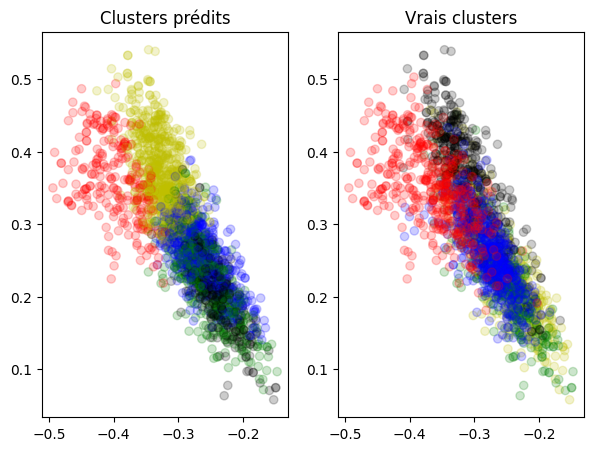

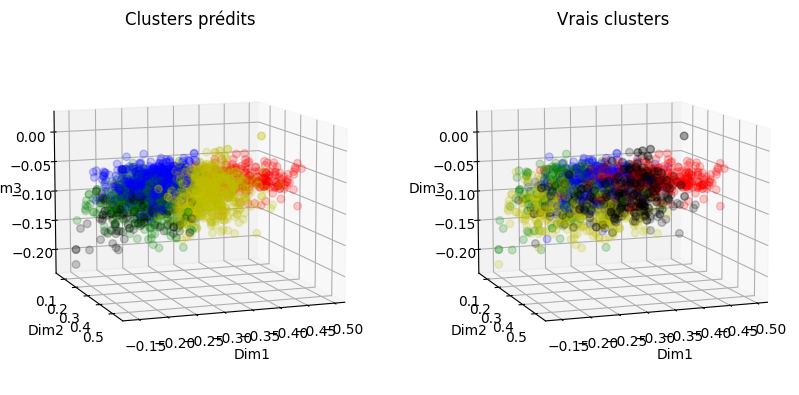

In [13]:
# KMeans++
kmeans = KMeans(n_clusters=5, init='k-means++', n_init='auto', random_state=7)
kmeans.fit(array_w2v)

# Evaluation de la qualité du clustering
print_metrics(kmeans.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(array_w2v, kmeans.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(array_w2v, kmeans.labels_, elev1=10, azim1=70, elev2=10, azim2=70)

NMI score:  0.18746419474577677
Accuracy:  0.29168539325842696
ARI:  0.14145559451101528


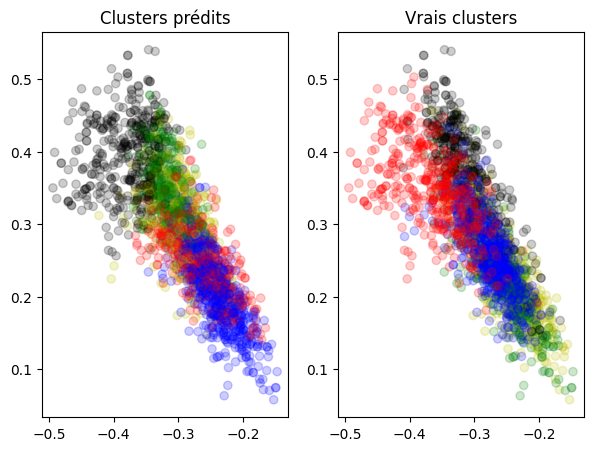

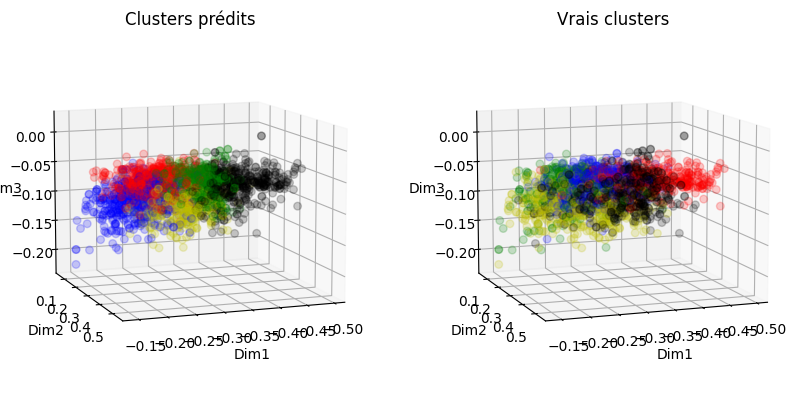

In [14]:
# KMedoids 
kmedoids = KMedoids(n_clusters=5, random_state=7)
kmedoids.fit(array_w2v)

# Evaluation de la qualité du clustering
print_metrics(kmedoids.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(array_w2v, kmedoids.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(array_w2v, kmedoids.labels_, elev1=10, azim1=70, elev2=10, azim2=70)

NMI score:  0.2138785050350061
Accuracy:  0.2247191011235955
ARI:  0.14608293991919313


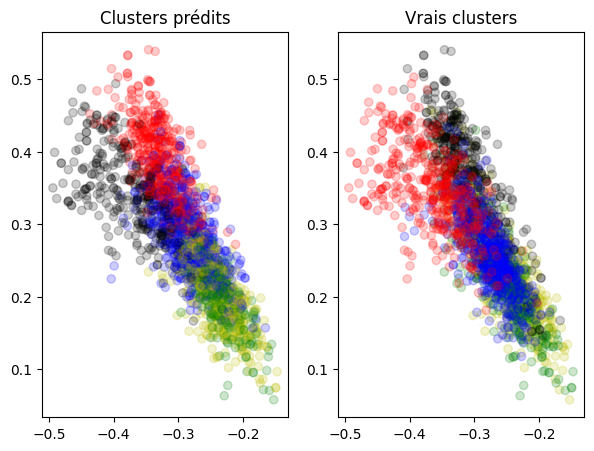

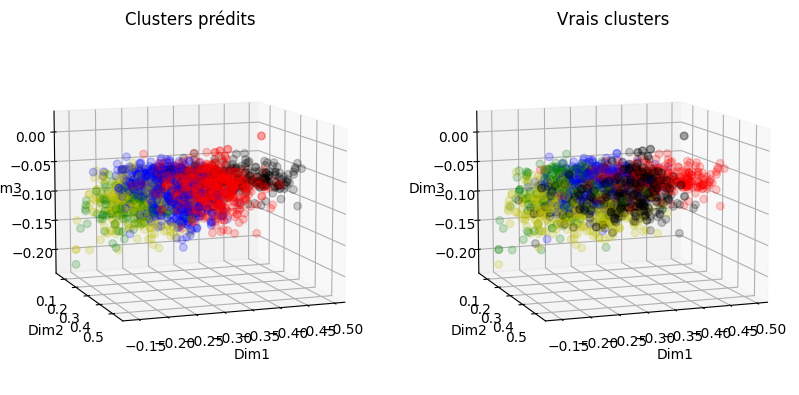

In [15]:
# Spherical KMeans
skmeans = SphericalKMeans(n_clusters=5, random_state=7)
skmeans.fit(csr_matrix(array_w2v))

# Evaluation de la qualité du clustering
print_metrics(skmeans.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(array_w2v, skmeans.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(array_w2v, skmeans.labels_, elev1=10, azim1=70, elev2=10, azim2=70)

NMI score:  0.00450754408517206
Accuracy:  0.2292134831460674
ARI:  5.084706884772582e-05


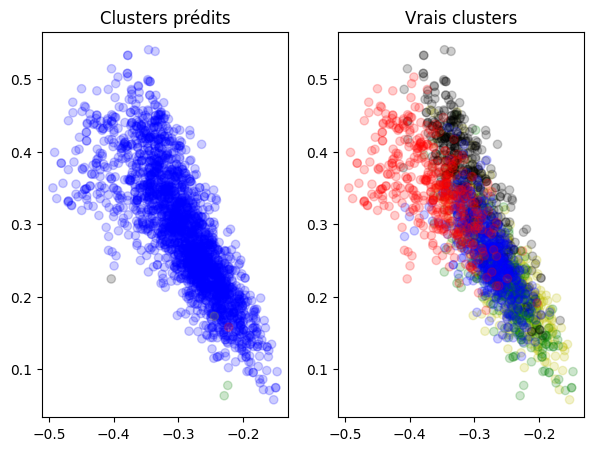

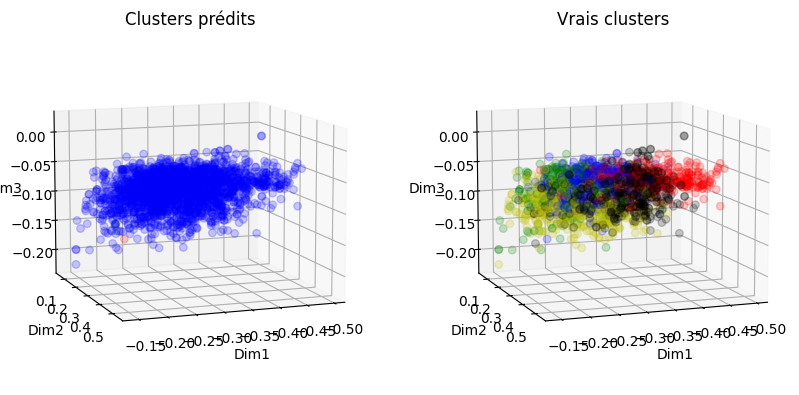

In [16]:
# HAC/CAH avec lien simple
hac_single = AgglomerativeClustering(n_clusters=5, linkage='single') 
hac_single.fit(array_w2v)

# Evaluation de la qualité du clustering
print_metrics(hac_single.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(array_w2v, hac_single.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(array_w2v, hac_single.labels_, elev1=10, azim1=70, elev2=10, azim2=70)

NMI score:  0.19008121778067774
Accuracy:  0.18651685393258427
ARI:  0.11494520023132619


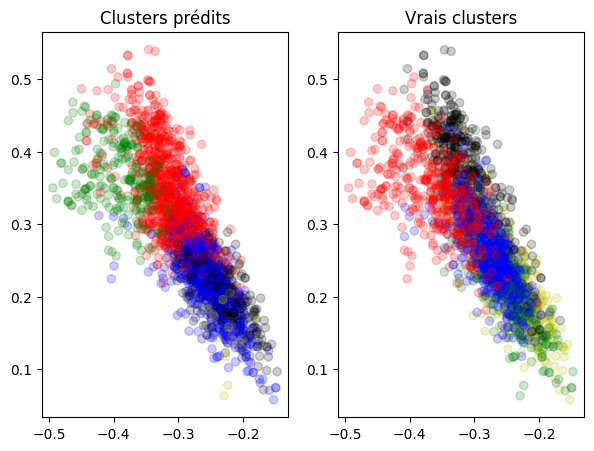

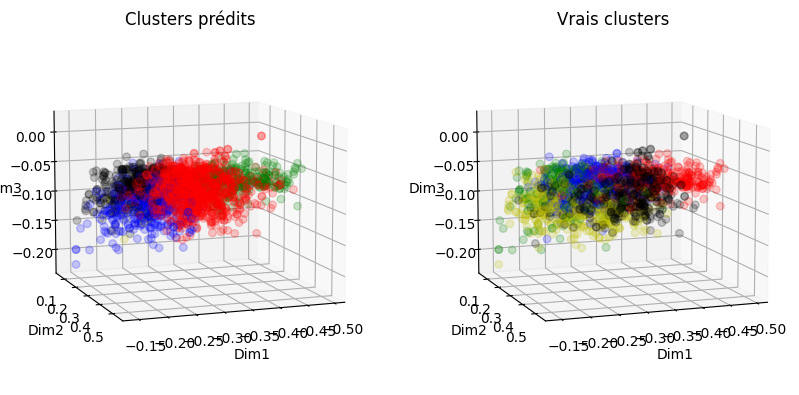

In [17]:
# HAC/CAH avec lien complet
hac_complete = AgglomerativeClustering(n_clusters=5, linkage='complete') 
hac_complete.fit(array_w2v)

# Evaluation de la qualité du clustering
print_metrics(hac_complete.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(array_w2v, hac_complete.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(array_w2v, hac_complete.labels_, elev1=10, azim1=70, elev2=10, azim2=70)

NMI score:  0.16801196169055196
Accuracy:  0.20674157303370785
ARI:  0.04121289268024924


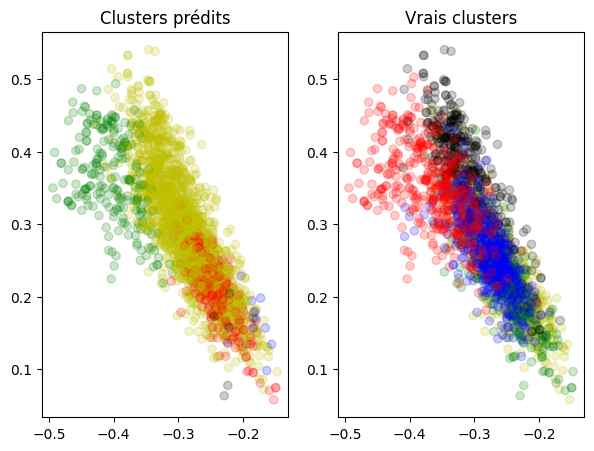

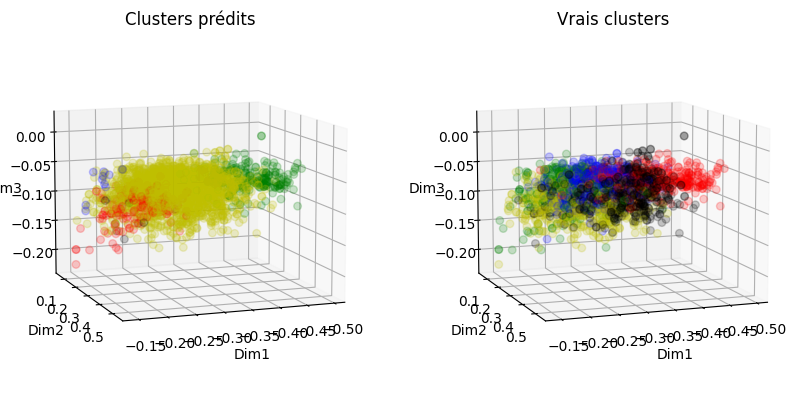

In [18]:
# HAC/CAH avec lien moyen
hac_avg = AgglomerativeClustering(n_clusters=5, linkage='average') 
hac_avg.fit(array_w2v)

# Evaluation de la qualité du clustering
print_metrics(hac_avg.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(array_w2v, hac_avg.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(array_w2v, hac_avg.labels_, elev1=10, azim1=70, elev2=10, azim2=70)

NMI score:  0.20739055717450544
Accuracy:  0.10337078651685393
ARI:  0.1507146778588336


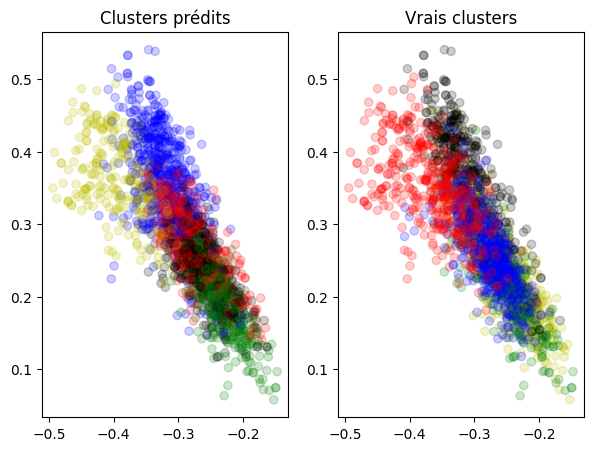

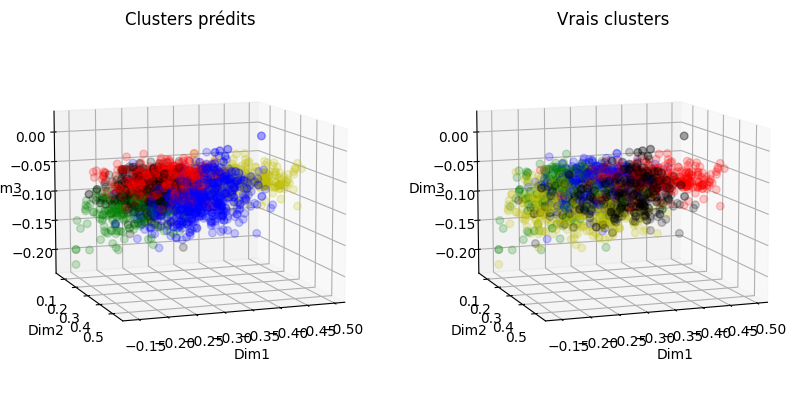

In [19]:
# HAC/CAH avec lien de Ward
hac_ward = AgglomerativeClustering(n_clusters=5, linkage='ward') 
hac_ward.fit(array_w2v)

# Evaluation de la qualité du clustering
print_metrics(hac_ward.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(array_w2v, hac_ward.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(array_w2v, hac_ward.labels_, elev1=10, azim1=70, elev2=10, azim2=70)

Dans l'espace d'origine aucun clustering n'est bon mais CAH avec le critères de Ward obtient les meilleurs scores.

## Clustering après réduction de dimension

### PCA

PC1     59.121363
PC2     19.591440
PC3     10.950666
PC4      5.898356
PC5      1.905579
PC6      0.911526
PC7      0.432411
PC8      0.350517
PC9      0.206068
PC10     0.122304
dtype: float64


<Axes: xlabel='Principal components', ylabel='Explained variance'>

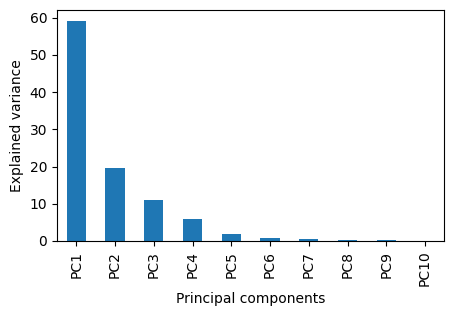

In [20]:
# Réduction de dimension avec PCA
pca = PCA(random_state=7)
pca_result = pca.fit_transform(array_w2v)

# Conversion des résultats en dataframe
pca_columns = ['PC' + str(c) for c in range(1, pca_result.shape[1]+1, 1)]
df_pca = pd.DataFrame(pca_result, index=X_w2v.index, columns=pca_columns) 

# Affichage  du pourcentage de variance expliquée par les 10 premières composantes principales
explained_variance = pd.Series(dict(zip(df_pca.columns, 100.0*pca.explained_variance_ratio_)))
print(explained_variance[0:10])
explained_variance[0:10].plot(kind='bar', figsize=(5, 3), rot=90, ylabel='Explained variance', xlabel='Principal components')

Les trois premières composantes expliquent près de 90% de la variance. La méthode du coude recommande de poursuivre avec ces trois composantes.



<Axes: xlabel='PC1', ylabel='PC2'>

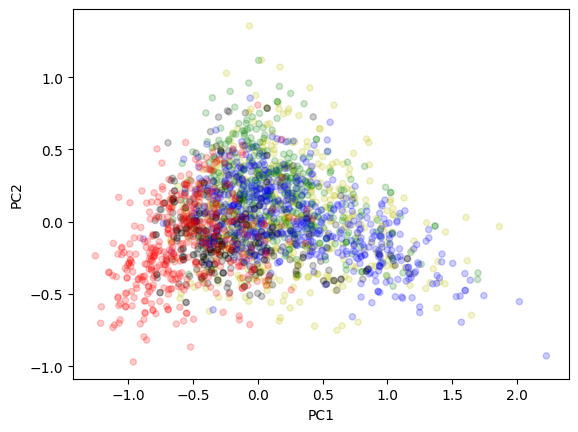

In [21]:
# Réduction de dimension avec PCA
pca = PCA(n_components=3, random_state=7)
pca_result = pca.fit_transform(array_w2v)

# Conversion des résultats en dataframe
pca_columns = ['PC' + str(c) for c in range(1, pca_result.shape[1]+1, 1)]
df_pca = pd.DataFrame(pca_result, index=X_w2v.index, columns=pca_columns)

# Affichage de l'espace réduit en 2D
fig, axs = figsize=(3, 3)
df_pca.plot(x='PC1', y='PC2', kind='scatter', color=y_colors, alpha=0.2)

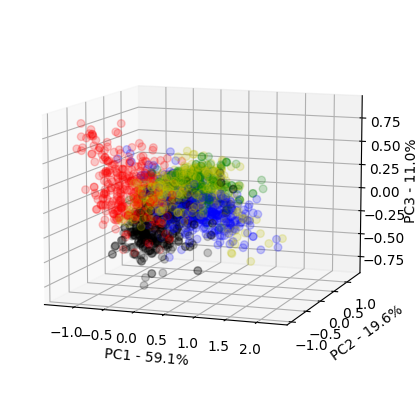

In [22]:
# Affichage de l'espace réduit en 3D
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(projection='3d')
ax.scatter(df_pca['PC1'], df_pca['PC2'], df_pca['PC3'], 
           marker='o', s=30, facecolor=y_colors, alpha=0.2)
ax.set_xlabel('PC1 - ' + '{:.1f}%'.format(explained_variance['PC1']))
ax.set_ylabel('PC2 - ' + '{:.1f}%'.format(explained_variance['PC2']))
ax.set_zlabel('PC3 - ' + '{:.1f}%'.format(explained_variance['PC3']))
ax.view_init(elev=10, azim=-70)

Les groupes sont très imbriqués. La séparation linéaire opérée par l'ACP ne semble pas améliorer les choses.

NMI score:  0.21203102056023962
Accuracy:  0.38696629213483147
ARI:  0.14701507146002465


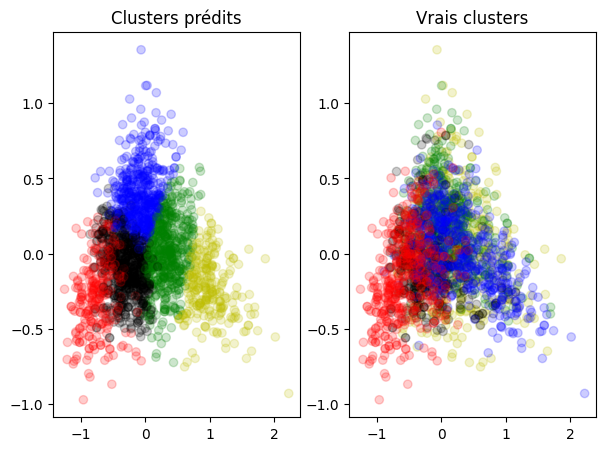

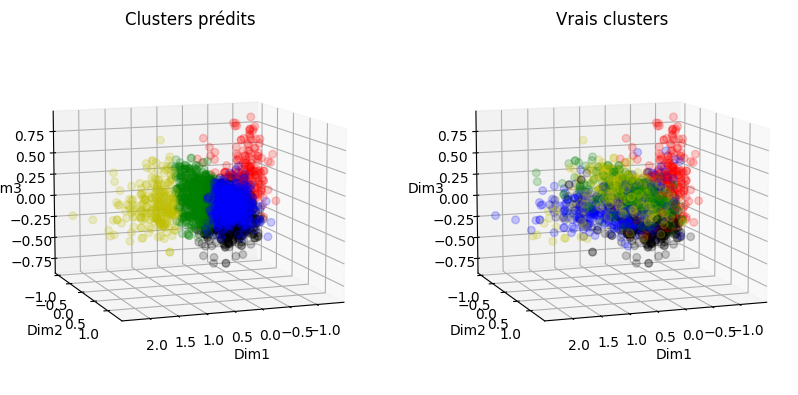

In [23]:
# KMeans++
pca_kmeans = KMeans(n_clusters=5, init='k-means++', n_init='auto', random_state=7)
pca_kmeans.fit(pca_result)

# Evaluation de la qualité du clustering
print_metrics(pca_kmeans.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(pca_result, pca_kmeans.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(pca_result, pca_kmeans.labels_, elev1=10, azim1=70, elev2=10, azim2=70)

NMI score:  0.1908275602499576
Accuracy:  0.13258426966292136
ARI:  0.13235950238063388


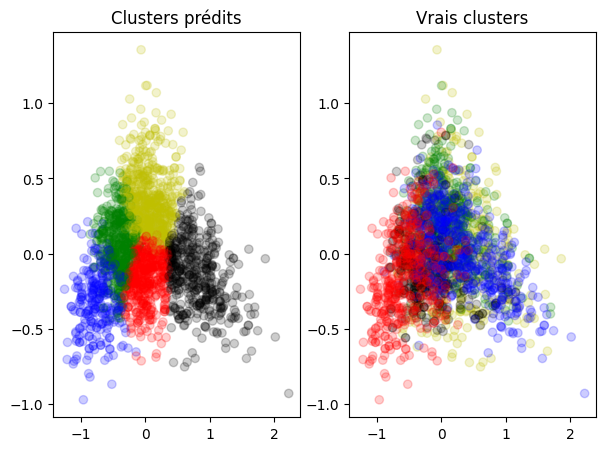

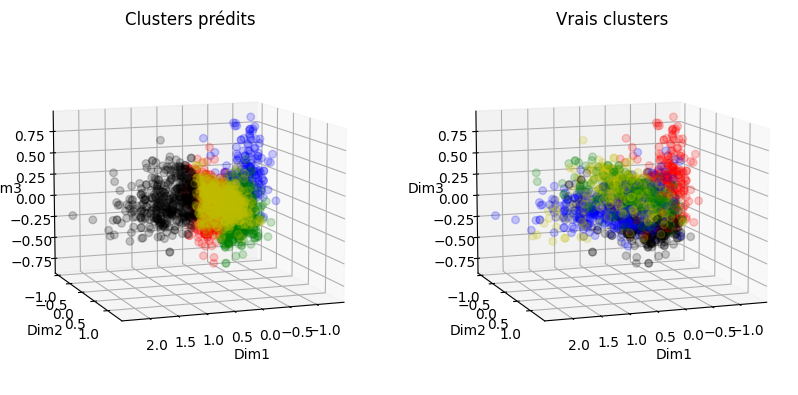

In [24]:
# KMedoids 
pca_kmedoids = KMedoids(n_clusters=5, random_state=7)
pca_kmedoids.fit(pca_result)

# Evaluation de la qualité du clustering
print_metrics(pca_kmedoids.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(pca_result, pca_kmedoids.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(pca_result, pca_kmedoids.labels_, elev1=10, azim1=70, elev2=10, azim2=70)

NMI score:  0.22259755225306602
Accuracy:  0.08719101123595506
ARI:  0.18966075708320157


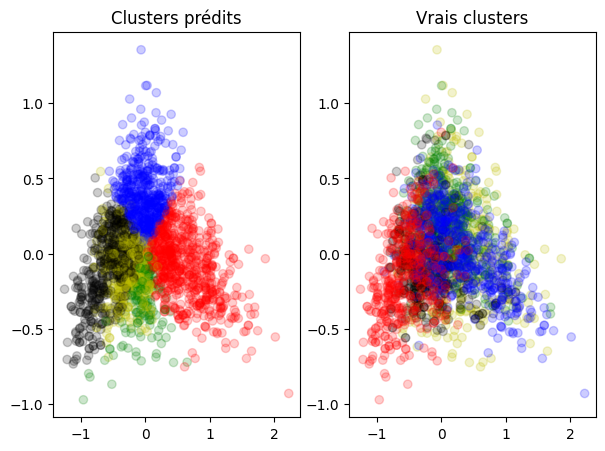

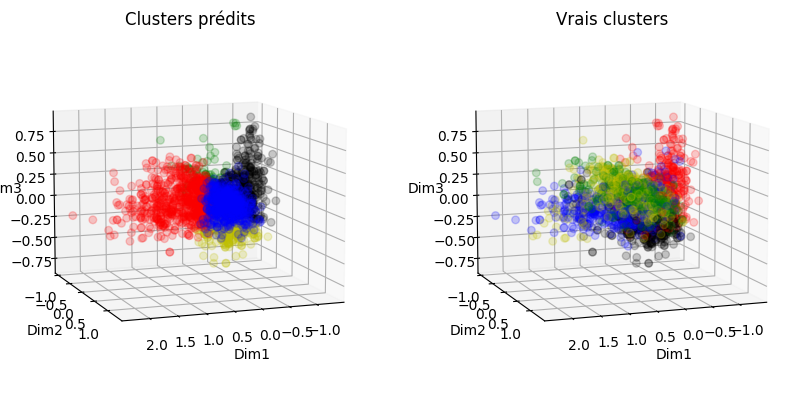

In [25]:
# Spherical KMeans
pca_skmeans = SphericalKMeans(n_clusters=5, random_state=7)
pca_skmeans.fit(csr_matrix(pca_result))

# Evaluation de la qualité du clustering
print_metrics(pca_skmeans.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(pca_result, pca_skmeans.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(pca_result, pca_skmeans.labels_, elev1=10, azim1=70, elev2=10, azim2=70)

NMI score:  0.004085044200442753
Accuracy:  0.22831460674157303
ARI:  -0.00029702289268368585


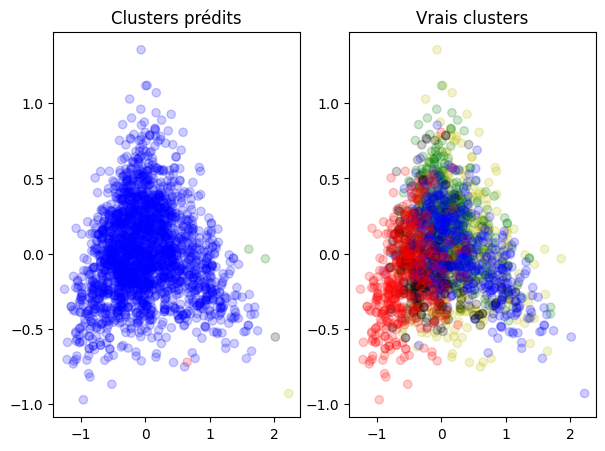

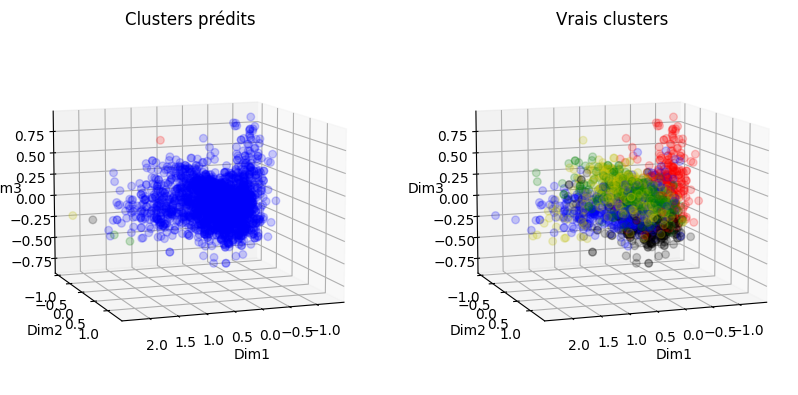

In [26]:
# HAC/CAH avec lien simple
pca_hac_single = AgglomerativeClustering(n_clusters=5, linkage='single') 
pca_hac_single.fit(pca_result)

# Evaluation de la qualité du clustering
print_metrics(pca_hac_single.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(pca_result, pca_hac_single.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(pca_result, pca_hac_single.labels_, elev1=10, azim1=70, elev2=10, azim2=70)

NMI score:  0.14513950762739927
Accuracy:  0.27415730337078653
ARI:  0.07196776372808762


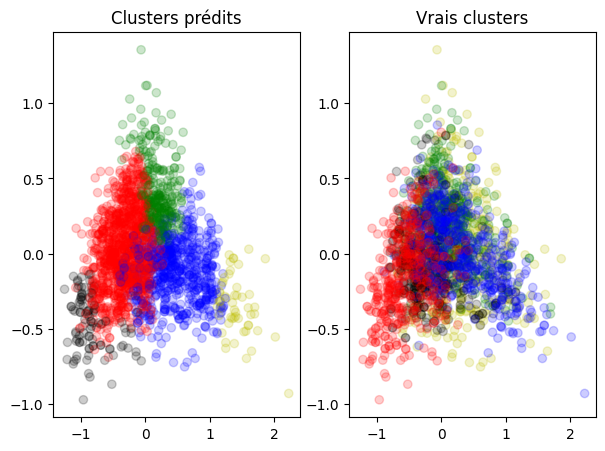

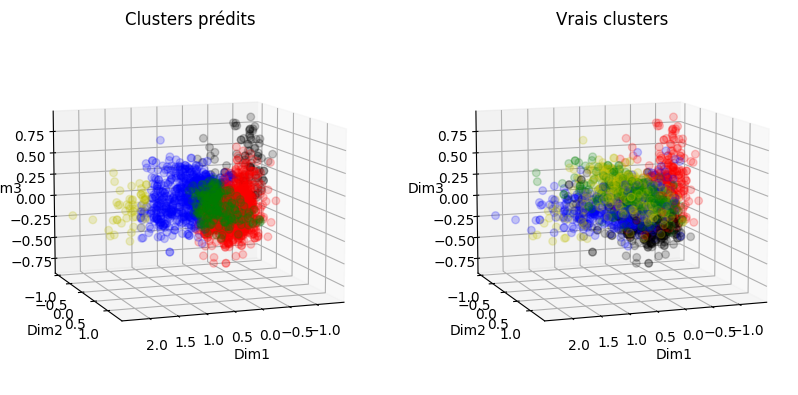

In [27]:
# HAC/CAH avec lien complet
pca_hac_complete = AgglomerativeClustering(n_clusters=5, linkage='complete') 
pca_hac_complete.fit(pca_result)

# Evaluation de la qualité du clustering
print_metrics(pca_hac_complete.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(pca_result, pca_hac_complete.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(pca_result, pca_hac_complete.labels_, elev1=10, azim1=70, elev2=10, azim2=70)

NMI score:  0.15077548253905862
Accuracy:  0.1802247191011236
ARI:  0.03154147826807508


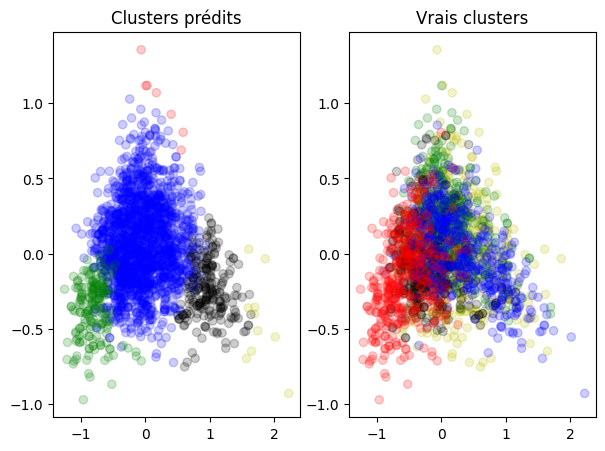

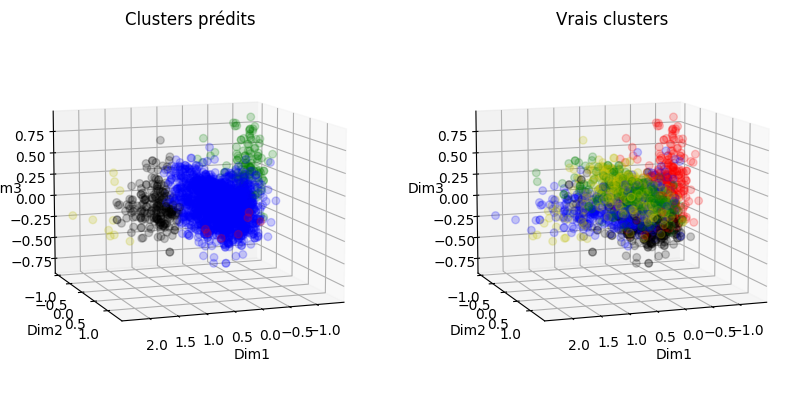

In [28]:
# HAC/CAH avec lien moyen
pca_hac_avg = AgglomerativeClustering(n_clusters=5, linkage='average') 
pca_hac_avg.fit(pca_result)

# Evaluation de la qualité du clustering
print_metrics(pca_hac_avg.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(pca_result, pca_hac_avg.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(pca_result, pca_hac_avg.labels_, elev1=10, azim1=70, elev2=10, azim2=70)

NMI score:  0.1778430528136268
Accuracy:  0.17887640449438202
ARI:  0.09824875330927878


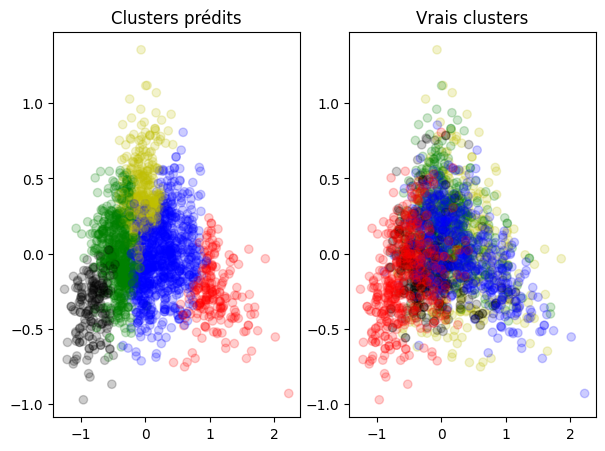

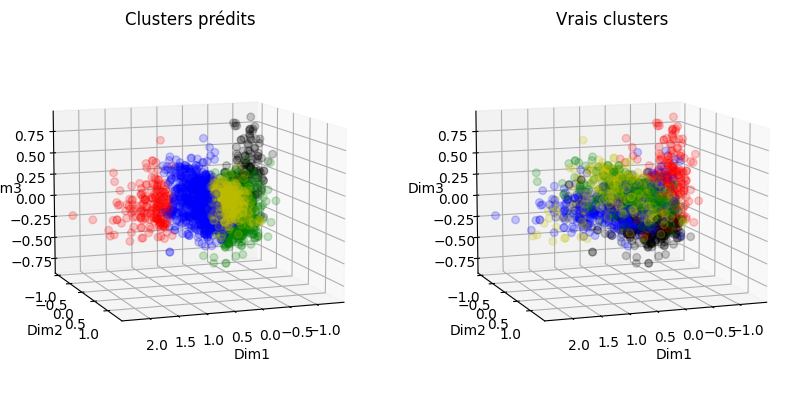

In [29]:
# HAC/CAH avec lien de Ward
pca_hac_ward = AgglomerativeClustering(n_clusters=5, linkage='ward') 
pca_hac_ward.fit(pca_result)

# Evaluation de la qualité du clustering
print_metrics(pca_hac_ward.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(pca_result, pca_hac_ward.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(pca_result, pca_hac_ward.labels_, elev1=10, azim1=70, elev2=10, azim2=70)

Les CAH avec lien complet et lien de Ward semblent un peu mieux réussir dans cet espace.

### t-SNE

In [30]:
# Réduction de dimension avec t-SNE
tsne = TSNE(n_components=3, init='pca', random_state=7)
tsne_result = tsne.fit_transform(array_w2v)

# Conversion des résultats en dataframe
tsne_columns = ['Dim' + str(c) for c in range(1, tsne_result.shape[1]+1, 1)]
df_tsne = pd.DataFrame(tsne_result, index=X_w2v.index, columns=tsne_columns) 

<Axes: xlabel='Dim1', ylabel='Dim2'>

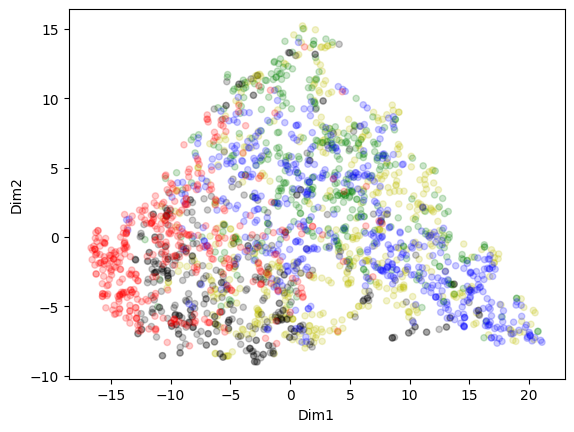

In [31]:
# Affichage de l'espace réduit en 2D
fig, axs = figsize=(3, 3)
df_tsne.plot(x='Dim1', y='Dim2', kind='scatter', color=y_colors, alpha=0.2)

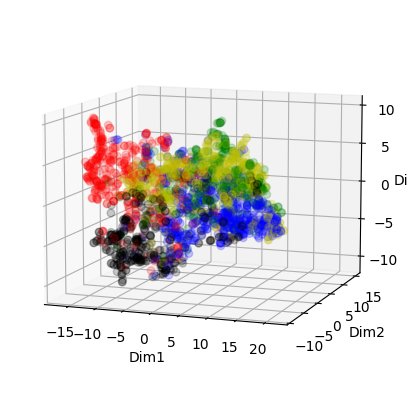

In [32]:
# Affichage de l'espace réduit en 3D
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(projection='3d')
ax.scatter(df_tsne['Dim1'], df_tsne['Dim2'], df_tsne['Dim3'], 
           marker='o', s=30, facecolor=y_colors, alpha=0.2)
ax.set_xlabel('Dim1')
ax.set_ylabel('Dim2')
ax.set_zlabel('Dim3')
ax.view_init(elev=10, azim=-70)

Les groupes sont moins denses mais pas mieux séparés que dans l'espace de l'ACP.

NMI score:  0.24117271717647093
Accuracy:  0.43550561797752807
ARI:  0.206654563014507


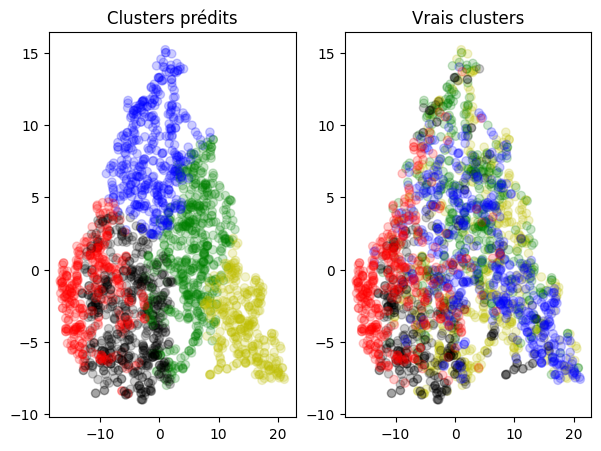

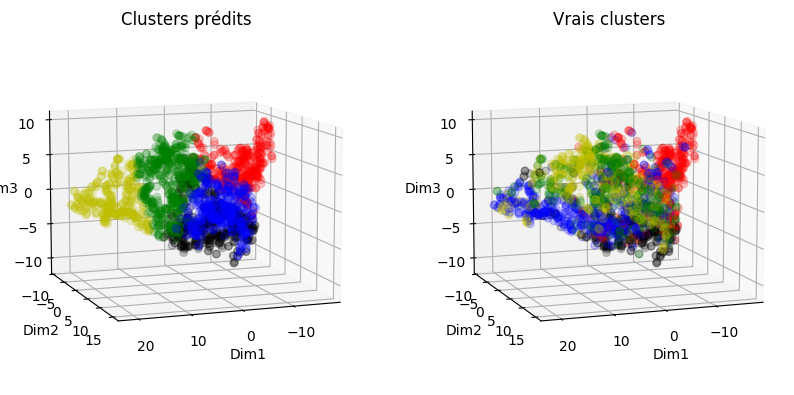

In [33]:
# KMeans++
tsne_kmeans = KMeans(n_clusters=5, init='k-means++', n_init='auto', random_state=7)
tsne_kmeans.fit(tsne_result)

# Evaluation de la qualité du clustering
print_metrics(tsne_kmeans.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(tsne_result, tsne_kmeans.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(tsne_result, tsne_kmeans.labels_, elev1=10, azim1=70, elev2=10, azim2=70)

NMI score:  0.2390965374547115
Accuracy:  0.1802247191011236
ARI:  0.2065783625609081


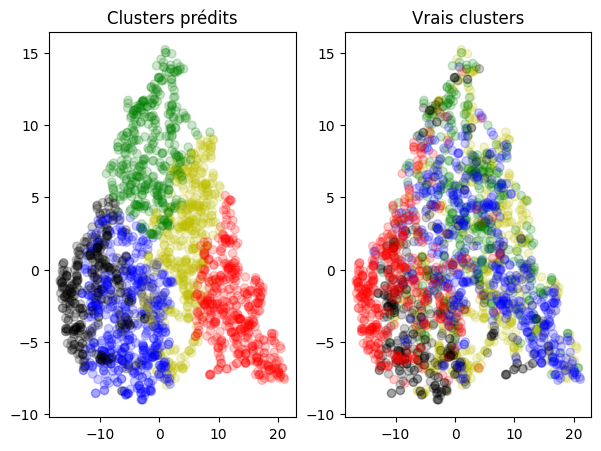

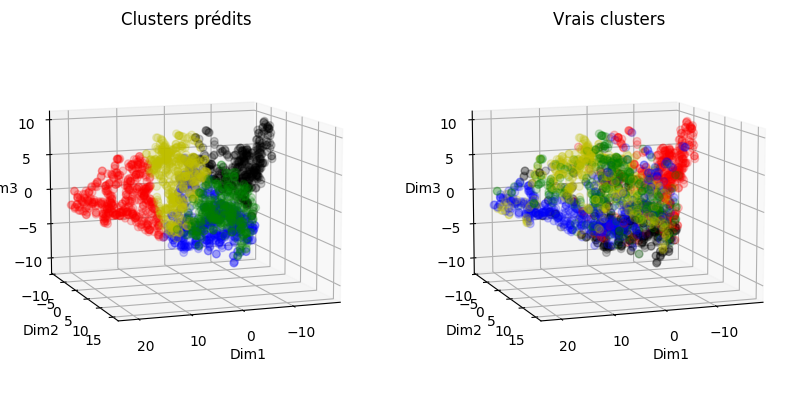

In [34]:
# KMedoids 
tsne_kmedoids = KMedoids(n_clusters=5, random_state=7)
tsne_kmedoids.fit(tsne_result)

# Evaluation de la qualité du clustering
print_metrics(tsne_kmedoids.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(tsne_result, tsne_kmedoids.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(tsne_result, tsne_kmedoids.labels_, elev1=10, azim1=70, elev2=10, azim2=70)

NMI score:  0.23987355553670298
Accuracy:  0.1447191011235955
ARI:  0.2103781339450651


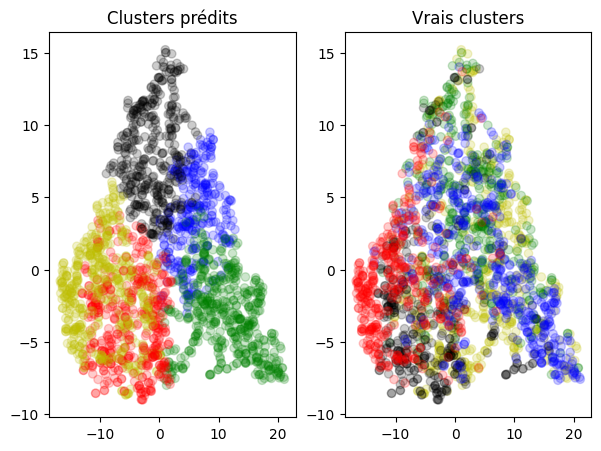

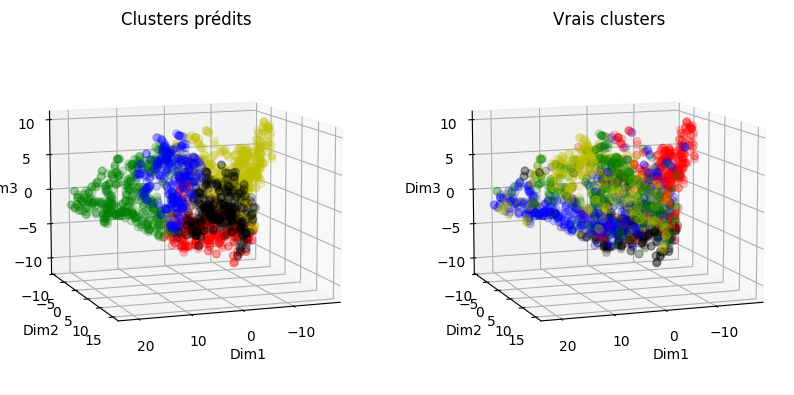

In [35]:
# Spherical KMeans
tsne_skmeans = SphericalKMeans(n_clusters=5, random_state=7)
tsne_skmeans.fit(csr_matrix(tsne_result))

# Evaluation de la qualité du clustering
print_metrics(tsne_skmeans.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(tsne_result, tsne_skmeans.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(tsne_result, tsne_skmeans.labels_, elev1=10, azim1=70, elev2=10, azim2=70)

NMI score:  0.013347602172776812
Accuracy:  0.22831460674157303
ARI:  0.0006129208753903708


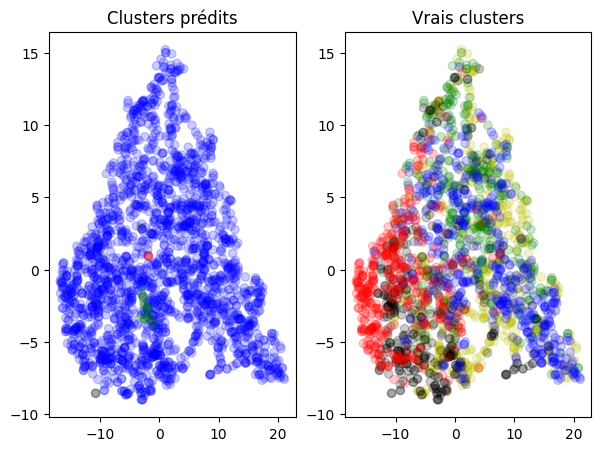

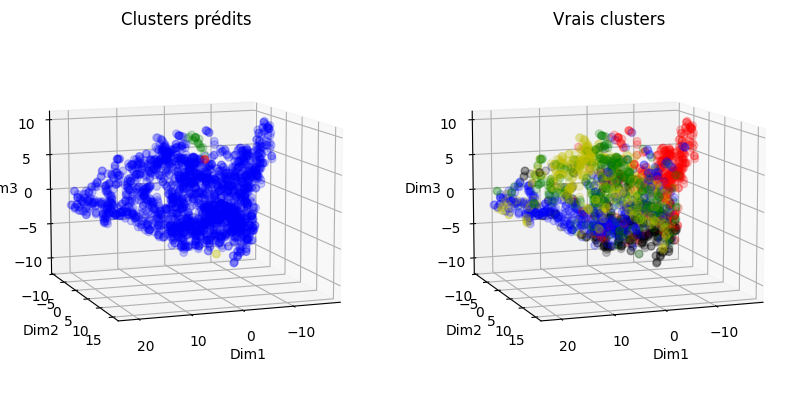

In [36]:
# HAC/CAH avec lien simple
tsne_hac_single = AgglomerativeClustering(n_clusters=5, linkage='single') 
tsne_hac_single.fit(tsne_result)

# Evaluation de la qualité du clustering
print_metrics(tsne_hac_single.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(tsne_result, tsne_hac_single.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(tsne_result, tsne_hac_single.labels_, elev1=10, azim1=70, elev2=10, azim2=70)

NMI score:  0.2490493134941513
Accuracy:  0.18157303370786518
ARI:  0.18973174107478397


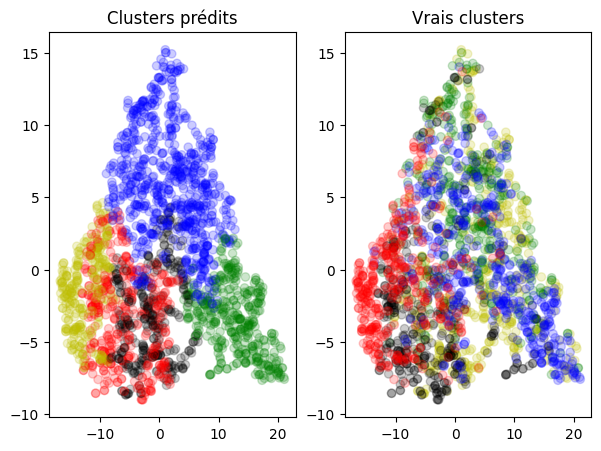

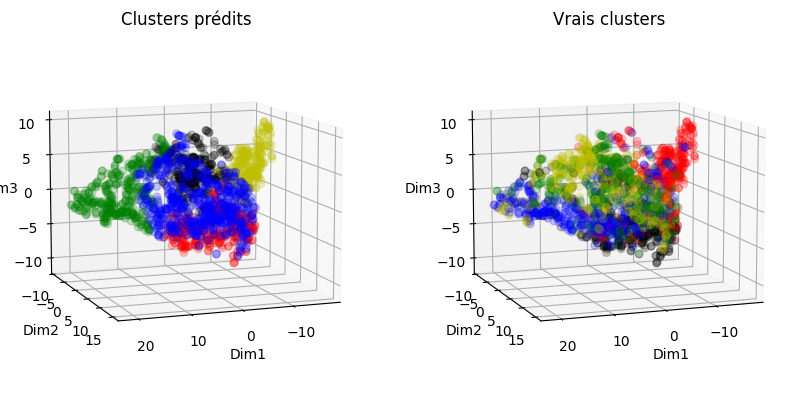

In [37]:
# HAC/CAH avec lien complet
tsne_hac_complete = AgglomerativeClustering(n_clusters=5, linkage='complete') 
tsne_hac_complete.fit(tsne_result)

# Evaluation de la qualité du clustering
print_metrics(tsne_hac_complete.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(tsne_result, tsne_hac_complete.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(tsne_result, tsne_hac_complete.labels_, elev1=10, azim1=70, elev2=10, azim2=70)

NMI score:  0.26920919760380113
Accuracy:  0.18741573033707865
ARI:  0.20213406080600013


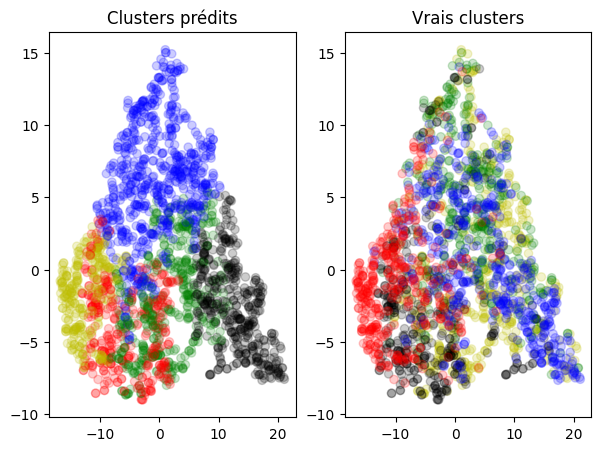

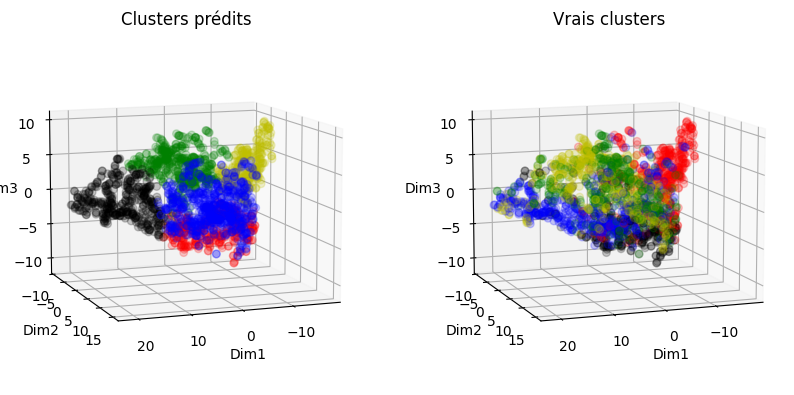

In [38]:
# HAC/CAH avec lien moyen
tsne_hac_avg = AgglomerativeClustering(n_clusters=5, linkage='average') 
tsne_hac_avg.fit(tsne_result)

# Evaluation de la qualité du clustering
print_metrics(tsne_hac_avg.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(tsne_result, tsne_hac_avg.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(tsne_result, tsne_hac_avg.labels_, elev1=10, azim1=70, elev2=10, azim2=70)

NMI score:  0.1778430528136268
Accuracy:  0.17887640449438202
ARI:  0.09824875330927878


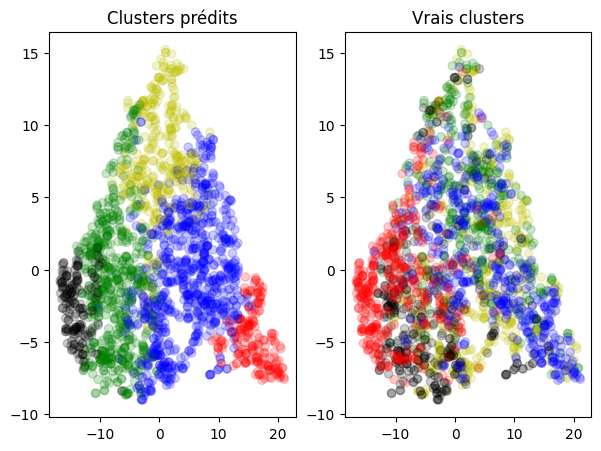

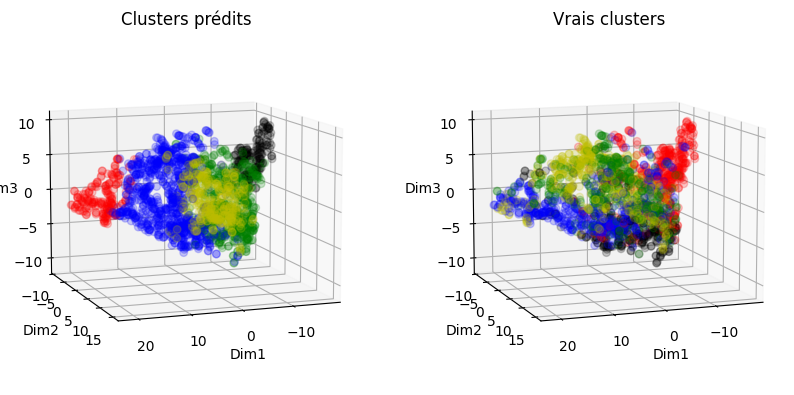

In [39]:
# HAC/CAH avec lien de Ward
tsne_hac_ward = AgglomerativeClustering(n_clusters=5, linkage='ward') 
tsne_hac_ward.fit(pca_result)

# Evaluation de la qualité du clustering
print_metrics(tsne_hac_ward.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(tsne_result, tsne_hac_ward.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(tsne_result, tsne_hac_ward.labels_, elev1=10, azim1=70, elev2=10, azim2=70)

La réduction de dimension non-linéaire de t-SNE permet d'obtenir des clusters un peu meilleurs. CAH avec le lien complet et moyen font un peu mieux.

### UMAP

In [40]:
# Réduction de dimension avec UMAP
umap = UMAP(n_components=3, random_state=7)
umap_result = umap.fit_transform(array_w2v)

# Conversion des résultats en dataframe
umap_columns = ['Dim' + str(c) for c in range(1, umap_result.shape[1]+1, 1)]
df_umap = pd.DataFrame(umap_result, index=X_w2v.index, columns=umap_columns)

<Axes: xlabel='Dim1', ylabel='Dim2'>

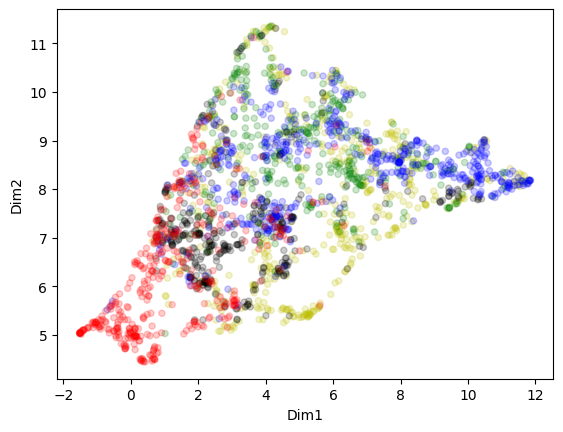

In [41]:
# Affichage de l'espace réduit en 2D
fig, axs = figsize=(3, 3)
df_umap.plot(x='Dim1', y='Dim2', kind='scatter', color=y_colors, alpha=0.2)

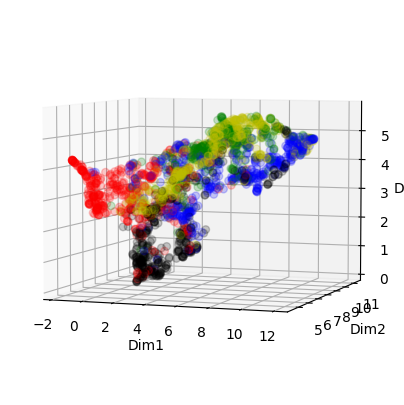

In [42]:
# Affichage de l'espace réduit en 3D
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(projection='3d')
ax.scatter(df_umap['Dim1'], df_umap['Dim2'], df_umap['Dim3'], 
           marker='o', s=30, facecolor=y_colors, alpha=0.2)
ax.set_xlabel('Dim1')
ax.set_ylabel('Dim2')
ax.set_zlabel('Dim3')
ax.view_init(elev=5, azim=-70)

Les groupes sont un peu mieux séparés. Les données forment une sorte de vague.

NMI score:  0.22123677567615918
Accuracy:  0.20584269662921348
ARI:  0.16683270405137934


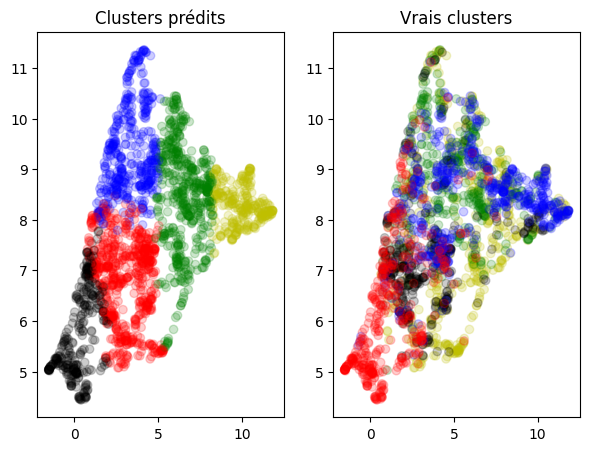

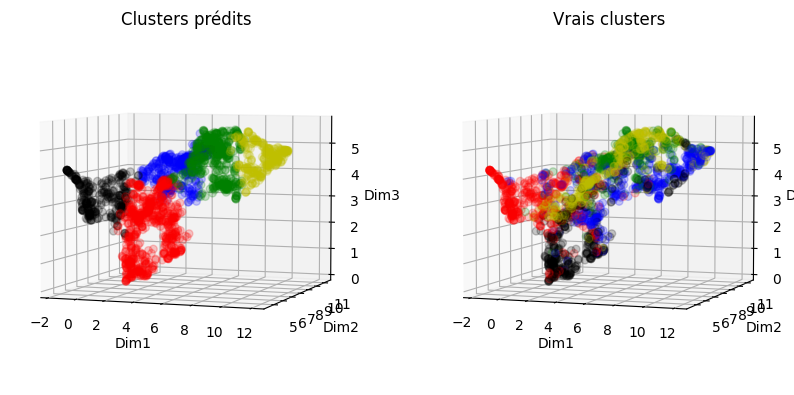

In [43]:
# KMeans++
umap_kmeans = KMeans(n_clusters=5, init='k-means++', n_init='auto', random_state=7)
umap_kmeans.fit(umap_result)

# Evaluation de la qualité du clustering
print_metrics(umap_kmeans.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(umap_result, umap_kmeans.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(umap_result, umap_kmeans.labels_, elev1=5, azim1=-70, elev2=5, azim2=-70)

NMI score:  0.22630956873644054
Accuracy:  0.4035955056179775
ARI:  0.17303404436320863


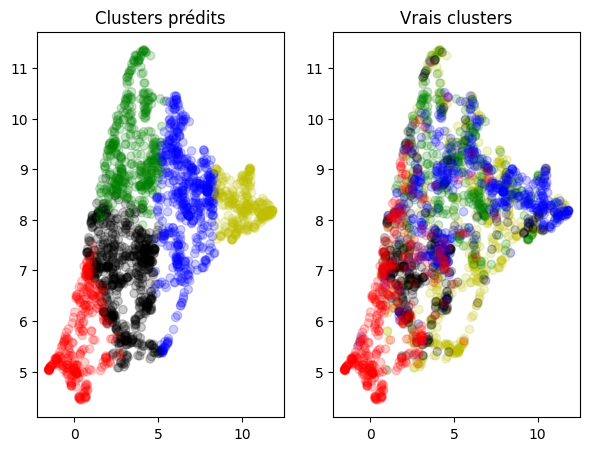

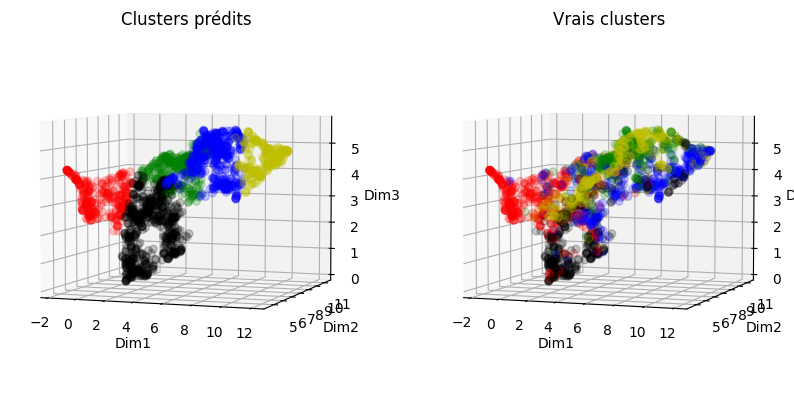

In [44]:
# KMedoids 
umap_kmedoids = KMedoids(n_clusters=5, random_state=7)
umap_kmedoids.fit(umap_result)

# Evaluation de la qualité du clustering
print_metrics(umap_kmedoids.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(umap_result, umap_kmedoids.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(umap_result, umap_kmedoids.labels_, elev1=5, azim1=-70, elev2=5, azim2=-70)

NMI score:  0.22471922885025522
Accuracy:  0.20224719101123595
ARI:  0.12739187872968455


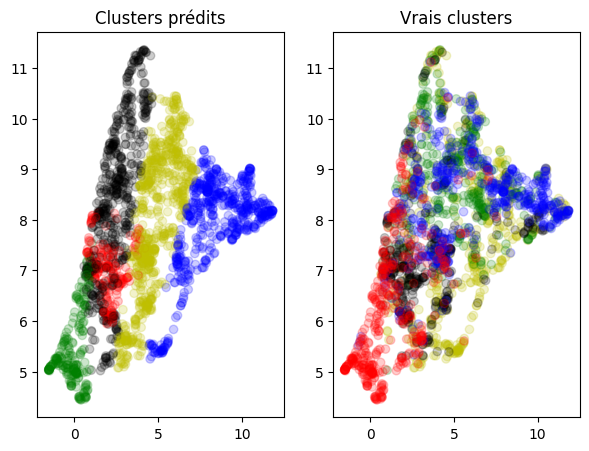

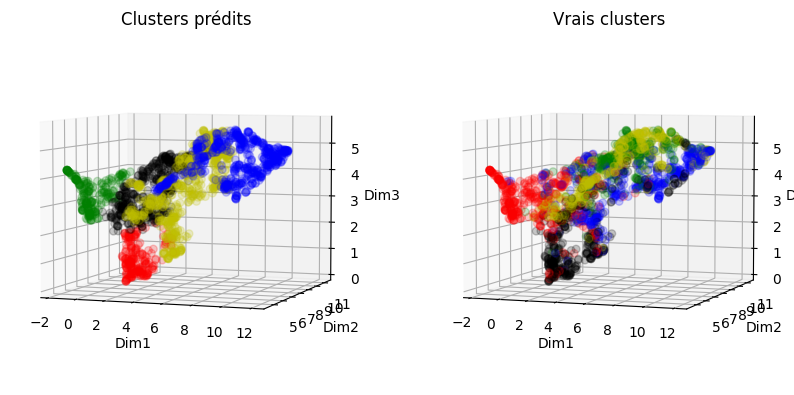

In [45]:
# Spherical KMeans
umap_skmeans = SphericalKMeans(n_clusters=5, random_state=7)
umap_skmeans.fit(csr_matrix(umap_result))

# Evaluation de la qualité du clustering
print_metrics(umap_skmeans.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(umap_result, umap_skmeans.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(umap_result, umap_skmeans.labels_, elev1=5, azim1=-70, elev2=5, azim2=-70)

NMI score:  0.003827119649801984
Accuracy:  0.2301123595505618
ARI:  0.00012713434111338628


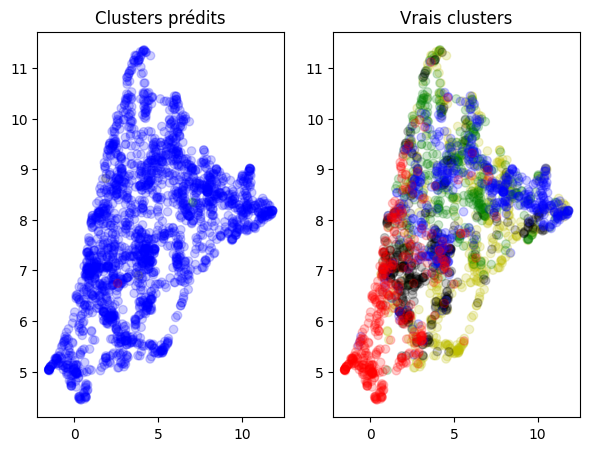

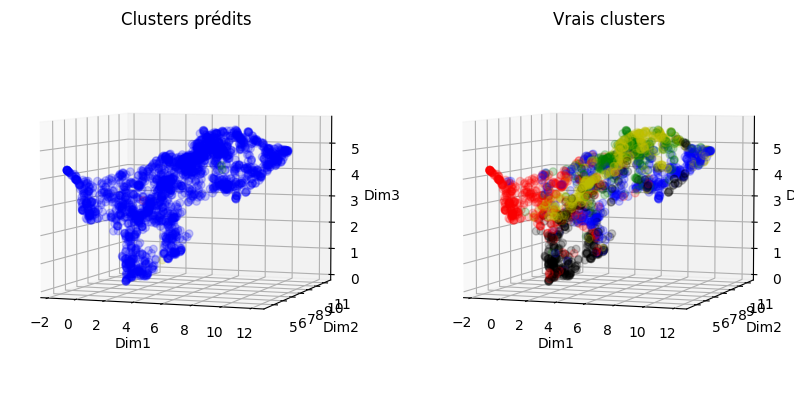

In [46]:
# HAC/CAH avec lien simple
umap_hac_single = AgglomerativeClustering(n_clusters=5, linkage='single') 
umap_hac_single.fit(umap_result)

# Evaluation de la qualité du clustering
print_metrics(umap_hac_single.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(umap_result, umap_hac_single.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(umap_result, umap_hac_single.labels_, elev1=5, azim1=-70, elev2=5, azim2=-70)

NMI score:  0.20890096959055443
Accuracy:  0.13707865168539327
ARI:  0.10196311952804162


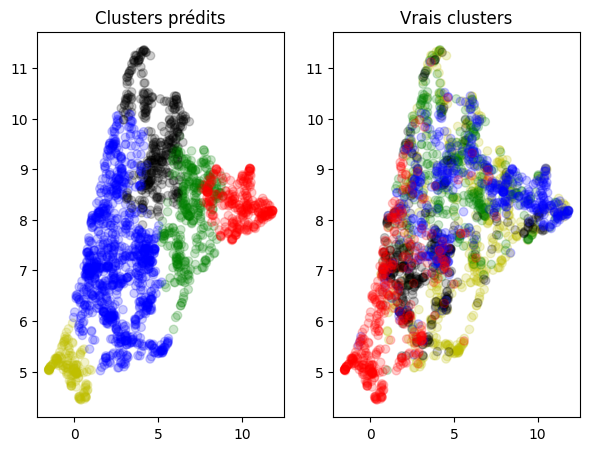

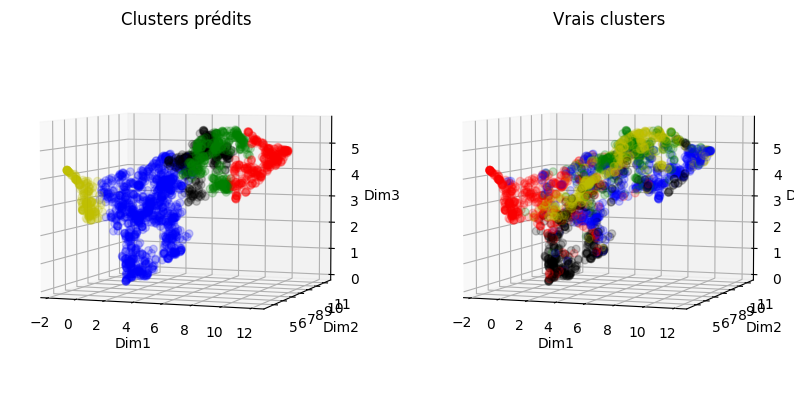

In [47]:
# HAC/CAH avec lien complet
umap_hac_complete = AgglomerativeClustering(n_clusters=5, linkage='complete') 
umap_hac_complete.fit(umap_result)

# Evaluation de la qualité du clustering
print_metrics(umap_hac_complete.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(umap_result, umap_hac_complete.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(umap_result, umap_hac_complete.labels_, elev1=5, azim1=-70, elev2=5, azim2=-70)

NMI score:  0.20858536453283286
Accuracy:  0.1352808988764045
ARI:  0.1234533522745978


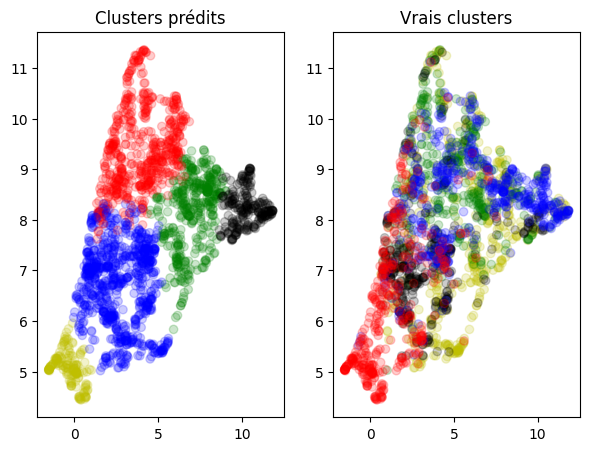

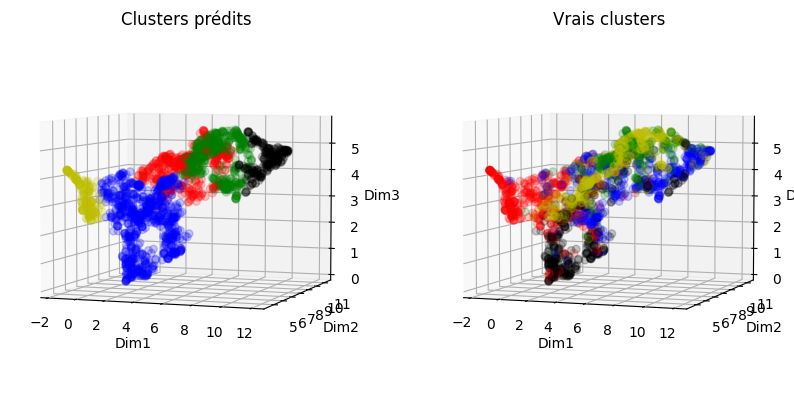

In [48]:
# HAC/CAH avec lien moyen
umap_hac_avg = AgglomerativeClustering(n_clusters=5, linkage='average') 
umap_hac_avg.fit(umap_result)

# Evaluation de la qualité du clustering
print_metrics(umap_hac_avg.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(umap_result, umap_hac_avg.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(umap_result, umap_hac_avg.labels_, elev1=5, azim1=-70, elev2=5, azim2=-70)

NMI score:  0.18315020921964903
Accuracy:  0.1298876404494382
ARI:  0.14093627349858193


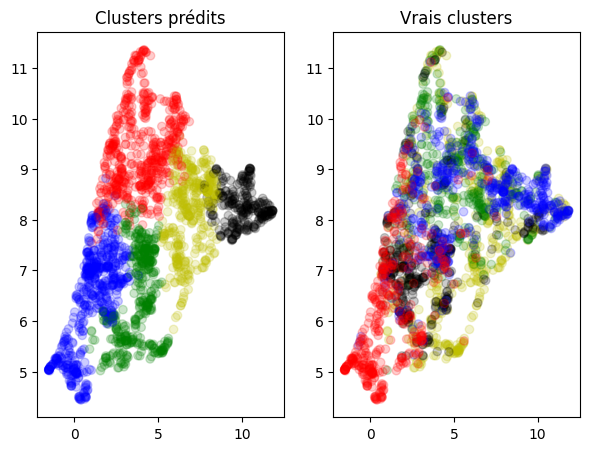

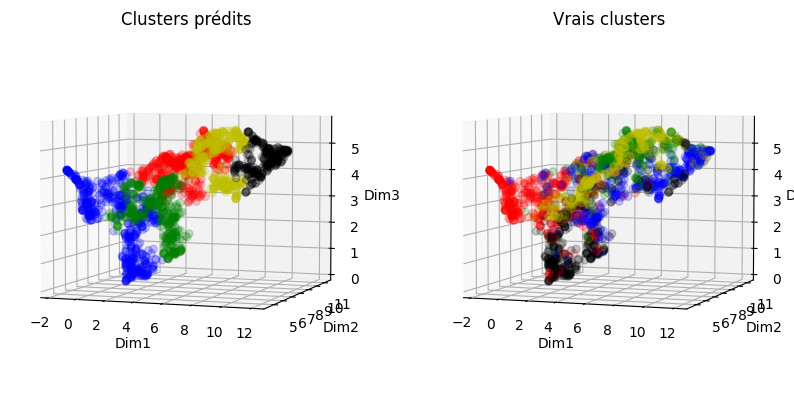

In [49]:
# HAC/CAH avec lien de Ward
umap_hac_ward = AgglomerativeClustering(n_clusters=5, linkage='ward') 
umap_hac_ward.fit(umap_result)

# Evaluation de la qualité du clustering
print_metrics(umap_hac_ward.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(umap_result, umap_hac_ward.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(umap_result, umap_hac_ward.labels_, elev1=5, azim1=-70, elev2=5, azim2=-70)

Les résultats sont comparables avec ceux obtenus après t-SNE.

### Autoencoders

In [52]:
# Réduction de dimension avec Autoencoders
ae_result = autoencoder(array_w2v.astype("float32"), embedding_dim=3, seed=7)

# Conversion des résultats en dataframe
ae_columns = ['Dim' + str(c) for c in range(1, ae_result.shape[1]+1, 1)]
df_ae = pd.DataFrame(ae_result, index=X_w2v.index, columns=ae_columns)

100%|██████████| 50/50 [00:02<00:00, 17.93it/s]


<Axes: xlabel='Dim1', ylabel='Dim2'>

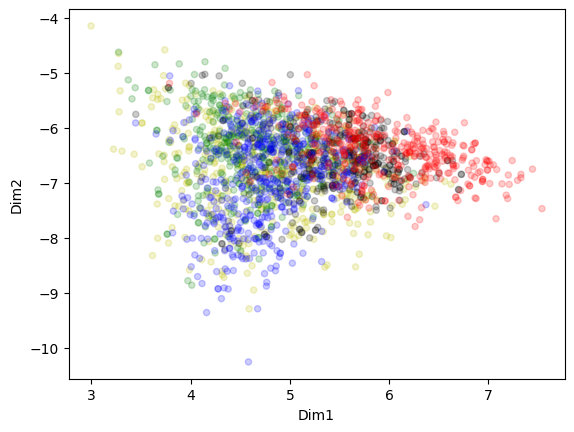

In [53]:
# Affichage de l'espace réduit en 2D
fig, axs = figsize=(3, 3)
df_ae.plot(x='Dim1', y='Dim2', kind='scatter', color=y_colors, alpha=0.2)

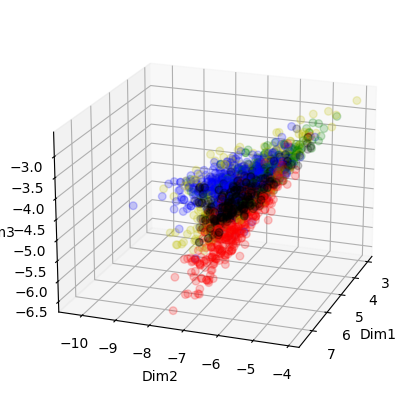

In [54]:
# Affichage de l'espace réduit en 3D
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(projection='3d')
ax.scatter(df_ae['Dim1'], df_ae['Dim2'], df_ae['Dim3'], 
           marker='o', s=30, facecolor=y_colors, alpha=0.2)
ax.set_xlabel('Dim1')
ax.set_ylabel('Dim2')
ax.set_zlabel('Dim3')
ax.view_init(elev=20, azim=20)

Dans cet espace réduit tous les clusters sont imbriqués, les résultats ne vont pas être bons.

NMI score:  0.14959878533041526
Accuracy:  0.19235955056179777
ARI:  0.09347100391477588


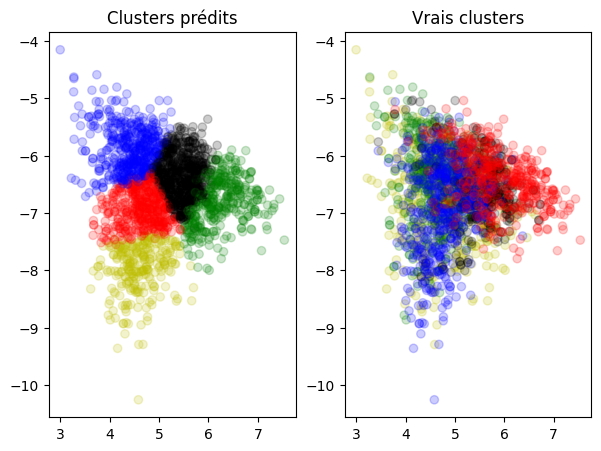

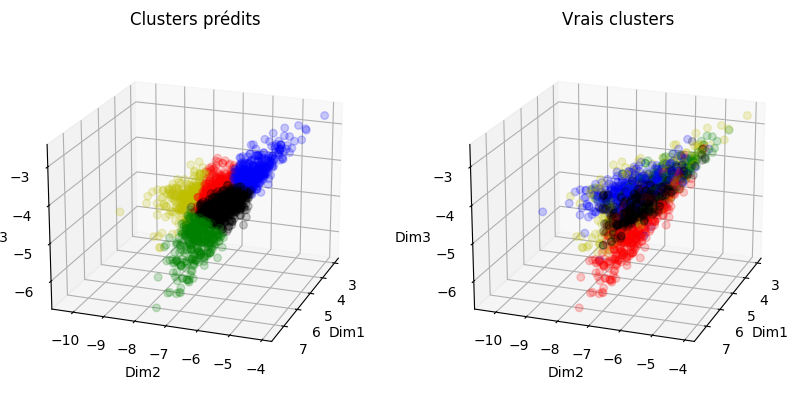

In [55]:
# KMeans++
ae_kmeans = KMeans(n_clusters=5, init='k-means++', n_init='auto', random_state=7)
ae_kmeans.fit(ae_result)

# Evaluation de la qualité du clustering
print_metrics(ae_kmeans.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(ae_result, ae_kmeans.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(ae_result, ae_kmeans.labels_, elev1=20, azim1=20, elev2=20, azim2=20)

NMI score:  0.14940053265399583
Accuracy:  0.16269662921348316
ARI:  0.10659674606528732


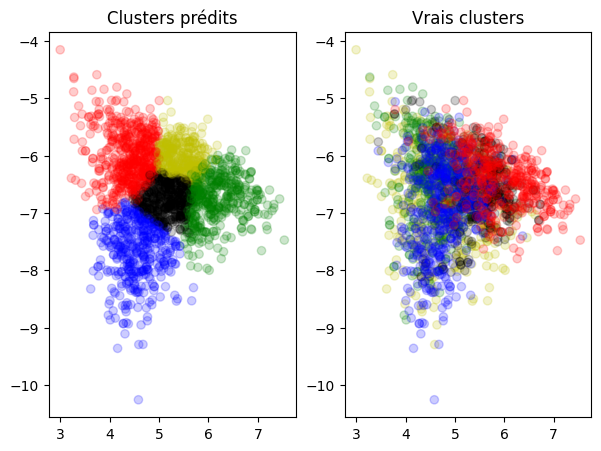

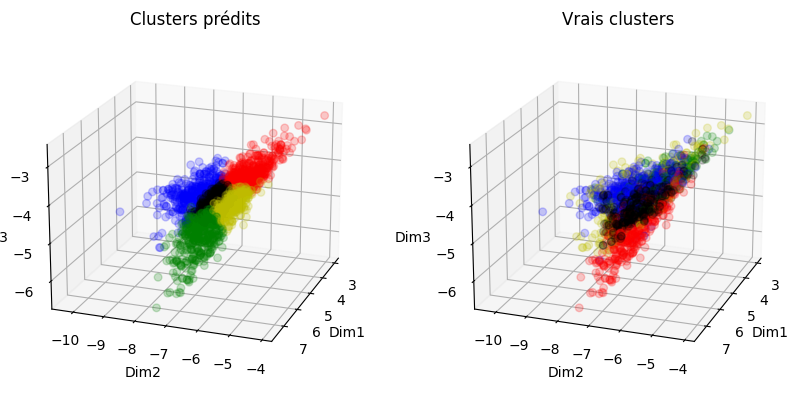

In [56]:
# KMedoids 
ae_kmedoids = KMedoids(n_clusters=5, random_state=7)
ae_kmedoids.fit(ae_result)

# Evaluation de la qualité du clustering
print_metrics(ae_kmedoids.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(ae_result, ae_kmedoids.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(ae_result, ae_kmedoids.labels_, elev1=20, azim1=20, elev2=20, azim2=20)

NMI score:  0.16151920474018783
Accuracy:  0.341123595505618
ARI:  0.10132749760314849


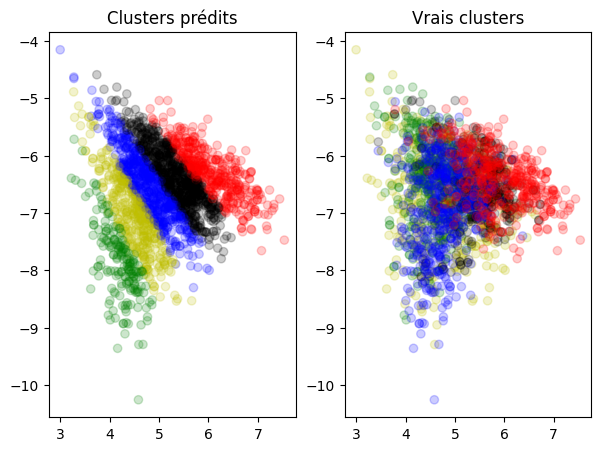

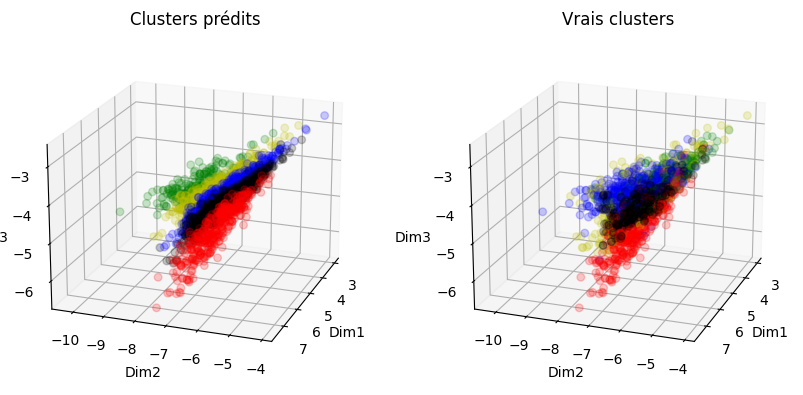

In [57]:
# Spherical KMeans
ae_skmeans = SphericalKMeans(n_clusters=5, random_state=7)
ae_skmeans.fit(csr_matrix(ae_result))

# Evaluation de la qualité du clustering
print_metrics(ae_skmeans.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(ae_result, ae_skmeans.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(ae_result, ae_skmeans.labels_, elev1=20, azim1=20, elev2=20, azim2=20)

NMI score:  0.003498527956016751
Accuracy:  0.22876404494382022
ARI:  -4.944305983590779e-05


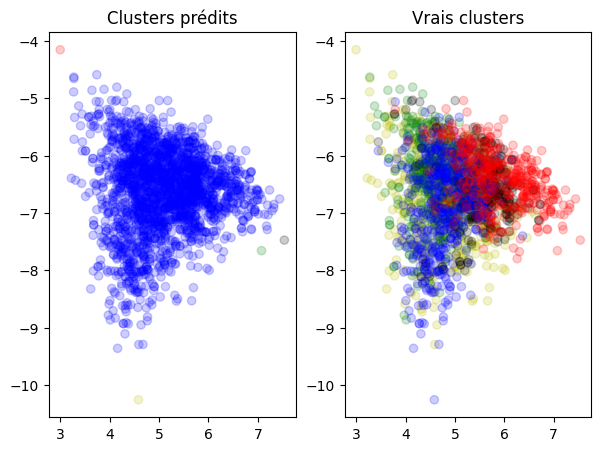

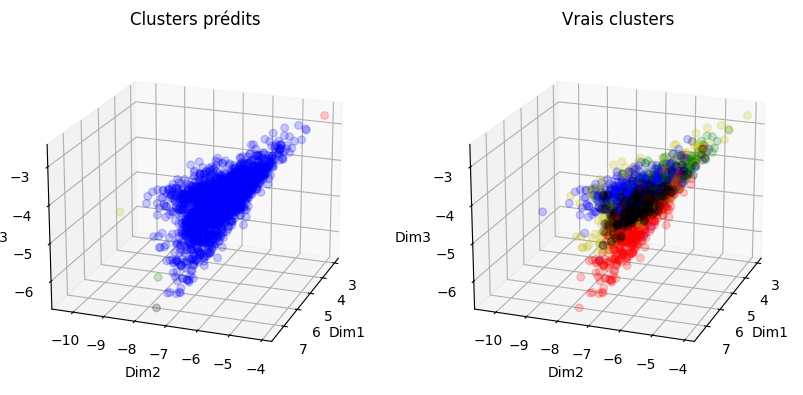

In [58]:
# HAC/CAH avec lien simple
ae_hac_single = AgglomerativeClustering(n_clusters=5, linkage='single') 
ae_hac_single.fit(ae_result)

# Evaluation de la qualité du clustering
print_metrics(ae_hac_single.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(ae_result, ae_hac_single.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(ae_result, ae_hac_single.labels_, elev1=20, azim1=20, elev2=20, azim2=20)

NMI score:  0.11072633674185876
Accuracy:  0.209438202247191
ARI:  0.07067889176798137


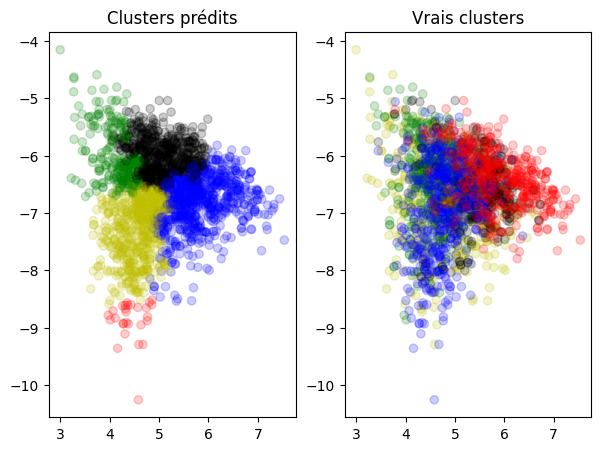

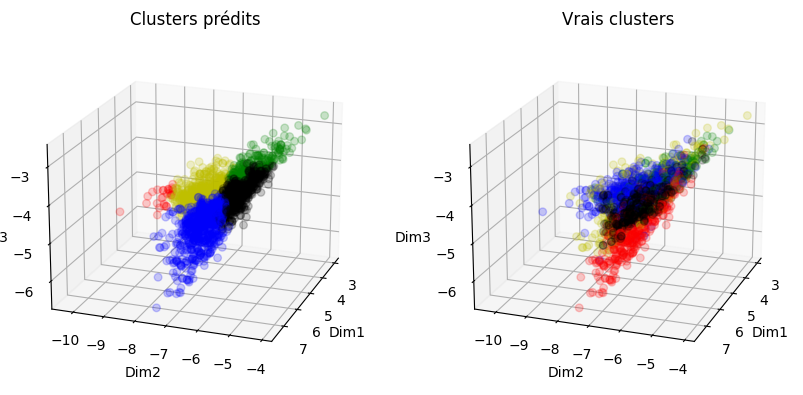

In [59]:
# HAC/CAH avec lien complet
ae_hac_complete = AgglomerativeClustering(n_clusters=5, linkage='complete') 
ae_hac_complete.fit(ae_result)

# Evaluation de la qualité du clustering
print_metrics(ae_hac_complete.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(ae_result, ae_hac_complete.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(ae_result, ae_hac_complete.labels_, elev1=20, azim1=20, elev2=20, azim2=20)

NMI score:  0.0217863913998488
Accuracy:  0.22561797752808987
ARI:  -0.0011196061922657777


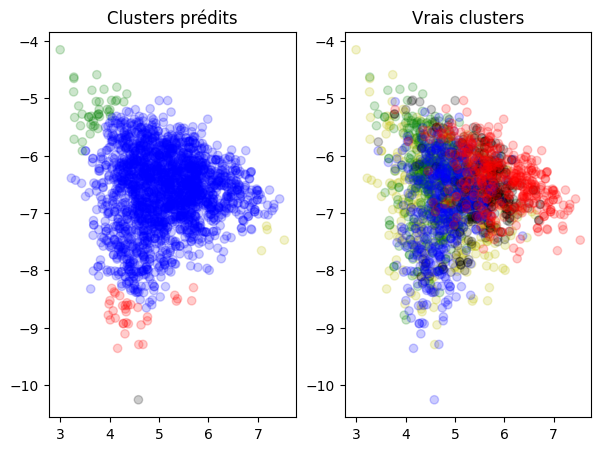

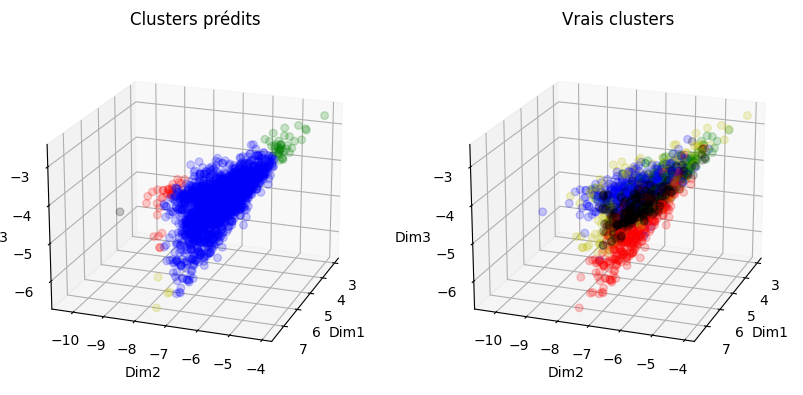

In [60]:
# HAC/CAH avec lien moyen
ae_hac_avg = AgglomerativeClustering(n_clusters=5, linkage='average') 
ae_hac_avg.fit(ae_result)

# Evaluation de la qualité du clustering
print_metrics(ae_hac_avg.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(ae_result, ae_hac_avg.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(ae_result, ae_hac_avg.labels_, elev1=20, azim1=20, elev2=20, azim2=20)

NMI score:  0.1579357701063335
Accuracy:  0.24674157303370786
ARI:  0.1008731522207139


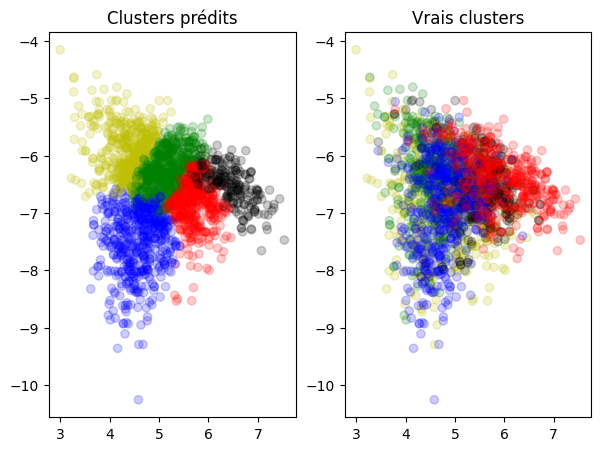

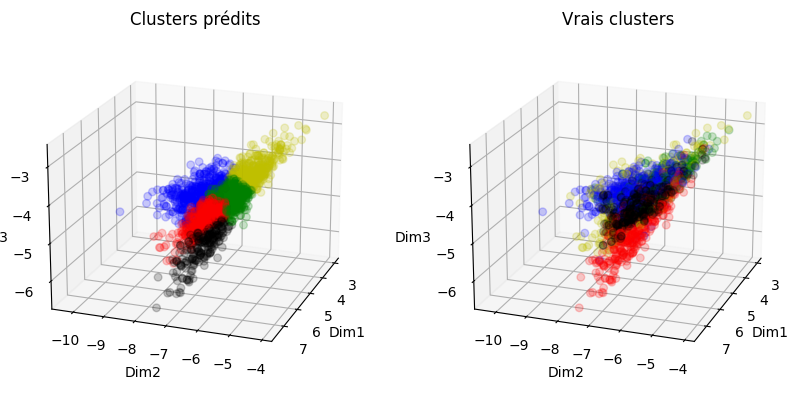

In [61]:
# HAC/CAH avec lien de Ward
ae_hac_ward = AgglomerativeClustering(n_clusters=5, linkage='ward') 
ae_hac_ward.fit(ae_result)

# Evaluation de la qualité du clustering
print_metrics(ae_hac_ward.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(ae_result, ae_hac_ward.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(ae_result, ae_hac_ward.labels_, elev1=20, azim1=20, elev2=20, azim2=20)

Les résultats des clusterings ne sont pas bons dans l'espace créé par les Autoencoders.

## Estimation du nombre de groupes avec NbClust

Estimation du nombre de classes avec le package R NbClust (avec un critère de distance euclidienne car nous comparons des lignes) 

Lien minimum (single): trouve clusters de formes allongées ou irrégulières mais sensible à l’effet de chaîne.

*** : The Hubert index is a graphical method of determining the number of clusters.
                In the plot of Hubert index, we seek a significant knee that corresponds to a 
                significant increase of the value of the measure i.e the significant peak in Hubert
                index second differences plot. 
 
*** : The D index is a graphical method of determining the number of clusters. 
                In the plot of D index, we seek a significant knee (the significant peak in Dindex
                second differences plot) that corresponds to a significant increase of the value of
                the measure. 
 
******************************************************************* 
* Among all indices:                                                
* 11 proposed 2 as the best number of clusters 
* 3 proposed 3 as the best number of clusters 
* 6 proposed 5 as the best number of clusters 
* 1 proposed 6 as the best number of clusters 
* 2 proposed 9 as the best number

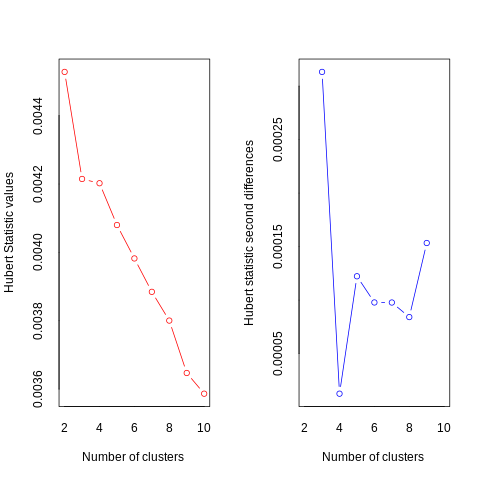

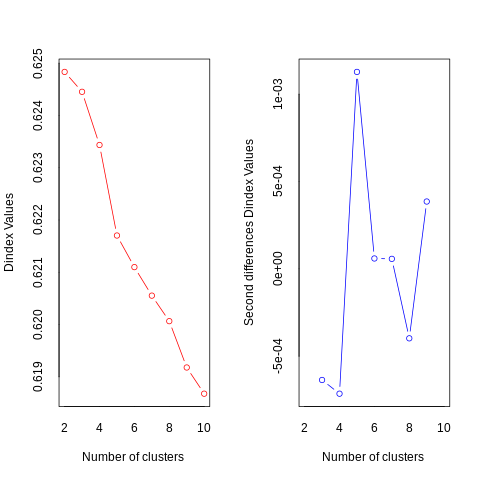

In [12]:
%%R -i array_w2v
res <- NbClust(array_w2v, distance="euclidean", min.nc=2, max.nc=10,
               method="single", index="all")

Lien maximum (complete): fusionne les deux groupes qui ont la plus petite distance maximale entre leurs points.

*** : The Hubert index is a graphical method of determining the number of clusters.
                In the plot of Hubert index, we seek a significant knee that corresponds to a 
                significant increase of the value of the measure i.e the significant peak in Hubert
                index second differences plot. 
 
*** : The D index is a graphical method of determining the number of clusters. 
                In the plot of D index, we seek a significant knee (the significant peak in Dindex
                second differences plot) that corresponds to a significant increase of the value of
                the measure. 
 
******************************************************************* 
* Among all indices:                                                
* 6 proposed 2 as the best number of clusters 
* 5 proposed 3 as the best number of clusters 
* 6 proposed 4 as the best number of clusters 
* 1 proposed 5 as the best number of clusters 
* 1 proposed 7 as the best number 

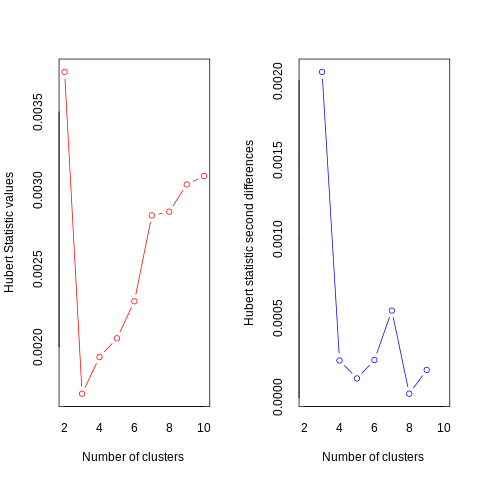

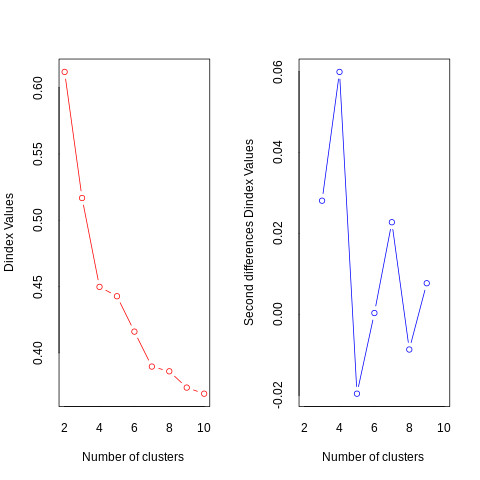

In [13]:
%%R
res <- NbClust(array_w2v, distance = "euclidean", min.nc=2, max.nc=10,
             method = "complete", index = "all")

Lien moyen (average): fusionne les deux groupes qui ont la plus petite distance moyenne entre tous leurs points.

*** : The Hubert index is a graphical method of determining the number of clusters.
                In the plot of Hubert index, we seek a significant knee that corresponds to a 
                significant increase of the value of the measure i.e the significant peak in Hubert
                index second differences plot. 
 
*** : The D index is a graphical method of determining the number of clusters. 
                In the plot of D index, we seek a significant knee (the significant peak in Dindex
                second differences plot) that corresponds to a significant increase of the value of
                the measure. 
 
******************************************************************* 
* Among all indices:                                                
* 8 proposed 2 as the best number of clusters 
* 13 proposed 3 as the best number of clusters 
* 1 proposed 5 as the best number of clusters 
* 1 proposed 7 as the best number of clusters 
* 1 proposed 10 as the best numbe

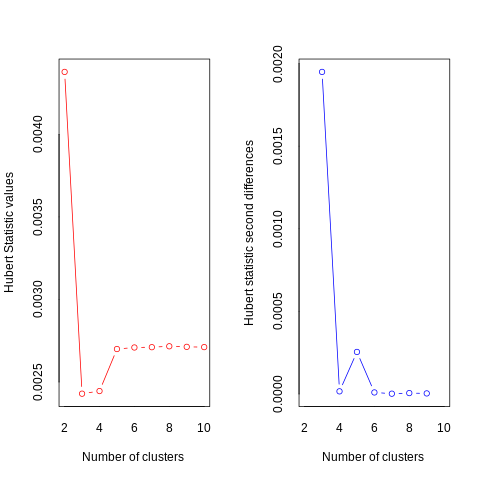

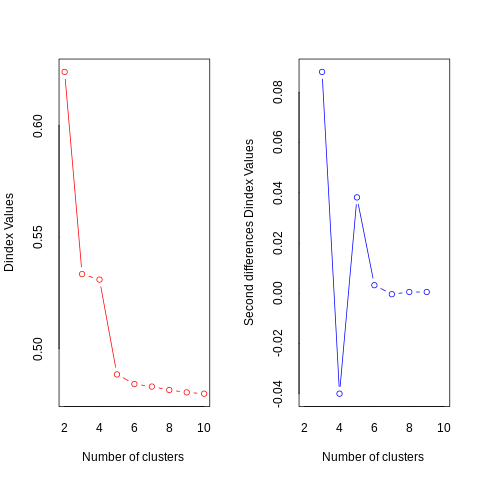

In [14]:
%%R
res <- NbClust(array_w2v, distance = "euclidean", min.nc=2, max.nc=10,
             method = "average", index = "all")

Lien de Ward: choisit les deux groupes à fusionner de manière à ce que la variance au sein de tous les groupes augmente le moins possible. Cela permet souvent d'obtenir des groupes de taille relativement égale. Trouve des clusters de forme sphérique.

*** : The Hubert index is a graphical method of determining the number of clusters.
                In the plot of Hubert index, we seek a significant knee that corresponds to a 
                significant increase of the value of the measure i.e the significant peak in Hubert
                index second differences plot. 
 
*** : The D index is a graphical method of determining the number of clusters. 
                In the plot of D index, we seek a significant knee (the significant peak in Dindex
                second differences plot) that corresponds to a significant increase of the value of
                the measure. 
 
******************************************************************* 
* Among all indices:                                                
* 8 proposed 2 as the best number of clusters 
* 6 proposed 3 as the best number of clusters 
* 3 proposed 4 as the best number of clusters 
* 1 proposed 6 as the best number of clusters 
* 1 proposed 8 as the best number 

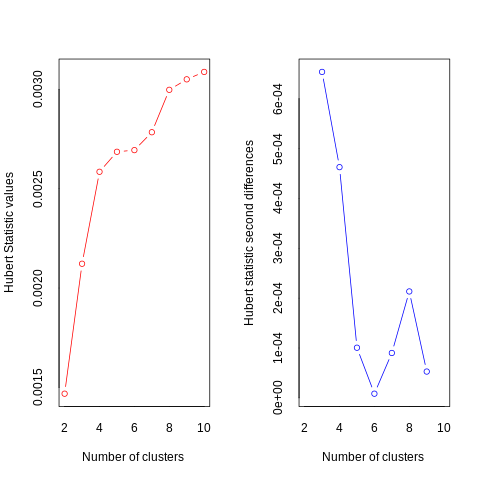

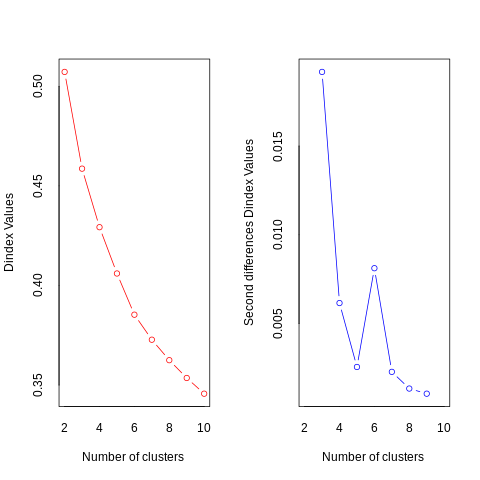

In [15]:
%%R
res <- NbClust(array_w2v, distance = "euclidean", min.nc=2, max.nc=10,
             method = "ward.D", index = "all")

Le nombre de clusters trouvé majoritairement par les différents critères et indices est de 2, mais la règle de la majorité du critère complet donne 3 tandis que celui de Ward donne 4 clusters.


## Synthèse

In [62]:
# Récupération des résultats des clusterings
preds = [kmeans.labels_, 
         kmedoids.labels_,
         skmeans.labels_,
         hac_single.labels_,
         hac_complete.labels_,
         hac_avg.labels_,
         hac_ward.labels_,
         pca_kmeans.labels_,
         pca_kmedoids.labels_,
         pca_skmeans.labels_,
         pca_hac_single.labels_,
         pca_hac_complete.labels_,
         pca_hac_avg.labels_,
         pca_hac_ward.labels_,
         tsne_kmeans.labels_,
         tsne_kmedoids.labels_,
         tsne_skmeans.labels_,
         tsne_hac_single.labels_,
         tsne_hac_complete.labels_,
         tsne_hac_avg.labels_,
         tsne_hac_ward.labels_,
         umap_kmeans.labels_,
         umap_kmedoids.labels_,
         umap_skmeans.labels_,
         umap_hac_single.labels_,
         umap_hac_complete.labels_,
         umap_hac_avg.labels_,
         umap_hac_ward.labels_,
         ae_kmeans.labels_,
         ae_kmedoids.labels_,
         ae_skmeans.labels_,
         ae_hac_single.labels_,
         ae_hac_complete.labels_,
         ae_hac_avg.labels_,
         ae_hac_ward.labels_]

# Récupération des scores
nmi_scores = [normalized_mutual_info_score(y_pred, y) for y_pred in preds]
accuracy_scores = [accuracy_score(y_pred, y) for y_pred in preds]
ari_scores = [adjusted_rand_score(y_pred, y) for y_pred in preds]

# Nom des méthodes
methods = ["Kmeans++", 
           "Kmedoids", 
           "Spherical Kmeans", 
           "CAH (simple)", 
           "CAH (complet)",
           "CAH (moyen)", 
           "CAH (Ward)",
           "PCA + Kmeans++", 
           "PCA + Kmedoids", 
           "PCA + Spherical Kmeans", 
           "PCA + CAH (simple)", 
           "PCA + CAH (complet)", 
           "PCA + CAH (moyen)", 
           "PCA + CAH (Ward)",
           "t-SNE + Kmeans++",
           "t-SNE + Kmedoids",
           "t-SNE + Spherical Kmeans",
           "t-SNE + CAH (simple)", 
           "t-SNE + CAH (complet)",
           "t-SNE + CAH (moyen)",
           "t-SNE + CAH (Ward)",
           "UMAP + Kmeans++",
           "UMAP + Kmedoids",
           "UMAP + Spherical Kmeans",
           "UMAP + CAH (simple)",
           "UMAP + CAH (complet)",
           "UMAP + CAH (moyen)",
           "UMAP + CAH (Ward)",
           "AE + Kmeans++",
           "AE + Kmedoids",
           "AE + Spherical Kmeans",
           "AE + CAH (simple)",
           "AE + CAH (complet)",
           "AE + CAH (moyen)",
           "AE + CAH (Ward)"]

# Création d'un dataframe
tab = pd.concat([pd.Series(nmi_scores, name="NMI", index=methods),
                 pd.Series(accuracy_scores, name="Accuracy", index=methods),
                 pd.Series(ari_scores, name="ARI", index=methods)],
                axis=1)

# Calcul de la moyenne des scores NMI et ARI
tab["NMI-ARI mean"] = tab[["NMI","ARI"]].mean(axis=1)
tab

,NMI,Accuracy,ARI,NMI-ARI mean
Kmeans++,0.217563,0.297528,0.148246,0.182905
Kmedoids,0.187464,0.291685,0.141456,0.164460
Spherical Kmeans,0.213879,0.224719,0.146083,0.179981
CAH (simple),0.004508,0.229213,0.000051,0.002279
CAH (complet),0.190081,0.186517,0.114945,0.152513
CAH (moyen),0.168012,0.206742,0.041213,0.104612
CAH (Ward),0.207391,0.103371,0.150715,0.179053
PCA + Kmeans++,0.212031,0.386966,0.147015,0.179523
PCA + Kmedoids,0.190828,0.132584,0.132360,0.161594
PCA + Spherical Kmeans,0.222598,0.087191,0.189661,0.206129


Le problème de l'utilisation de la précision est qu'elle exige que les étiquettes de clusters attribuées correspondent exactement à la vérité terrain. Cependant, les étiquettes des clusters ne sont pas significatives en elles-mêmes. La seule chose qui compte est de savoir quels points se trouvent dans le même cluster. 

Il vaut mieux se référer au NMI et ARI. En outre ces métriques donnent un score entre O et 1, 1 étant le maximum. Il est donc possible de calculer la moyenne de ces deux scores pour trouver la combinaison qui donne les meilleurs résultats globaux. 

In [63]:
# Meilleure combinaison
tab[tab["NMI-ARI mean"]==tab["NMI-ARI mean"].max()]

,NMI,Accuracy,ARI,NMI-ARI mean
t-SNE + CAH (moyen),0.269209,0.187416,0.202134,0.235672


En combinant toutes les métriques la méthode alliant t-SNE et CAH moyen obtient les meilleurs résultats mais ils sont très faibles. Les réductions de dimension améliorent les résultats des clustering par rapport à ceux effectués dans l'espace d'origine mais de peu. Aucune méthode n'est satisfaisante.

# Partie 2 : Approche jointe/simultanée

## Reduced KMeans

In [64]:
%%R -i array_w2v
# Approche simultanée ACP avec KMeans
rkm_result = cluspca(array_w2v, nclus=5, ndim=3, nstart=10, seed=7)

  |======================================================================| 100%

NMI score:  0.2163679465382054
Accuracy:  0.15191011235955057
ARI:  0.1530809413073773


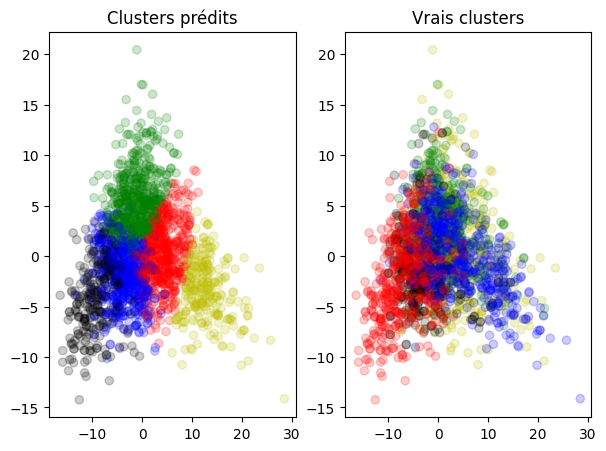

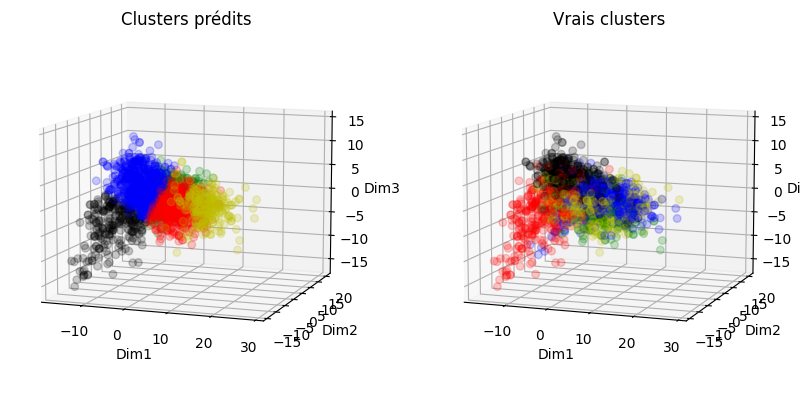

In [65]:
# Récupération des objet R contenant les résultats
rkm_labels = np.array(robjects.r('rkm_result$cluster'))
rkm_result = np.array(robjects.r('rkm_result$obscoord'))

# Soustraction pour faire correspondre les valeurs issues de R à celles de python
rkm_labels = rkm_labels - 1

# Evaluation de la qualité du clustering
print_metrics(rkm_labels, y)

# Comparaison des clusters en 2D 
clust_viz_2D(rkm_result, rkm_labels)

# Comparaison des clusters en 3D
clust_viz_3D(rkm_result, rkm_labels, elev1=10, azim1=-70, elev2=10, azim2=-70)

Les clusters ne sont pas bien séparés. Les résultats ne sont pas meilleurs.

## Deep KMeans

In [67]:
# Approche simultanée avec Deep KMeans
dkm_result, dkm_result_labels = DKM(array_w2v, n_clusters=5, n_components=3)

<ipython-input-66-b8ce86626ea5>:15: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input,


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:27<00:00,  1.84it/s]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [00:58<00:00,  2.92s/it]


NMI score:  0.16388795331244785
Accuracy:  0.22966292134831462
ARI:  0.10869788510142324


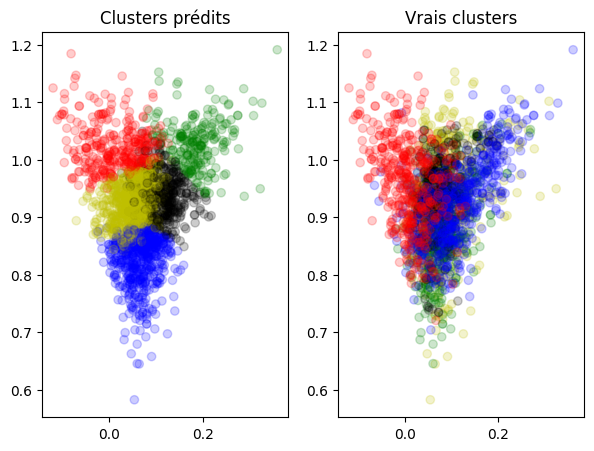

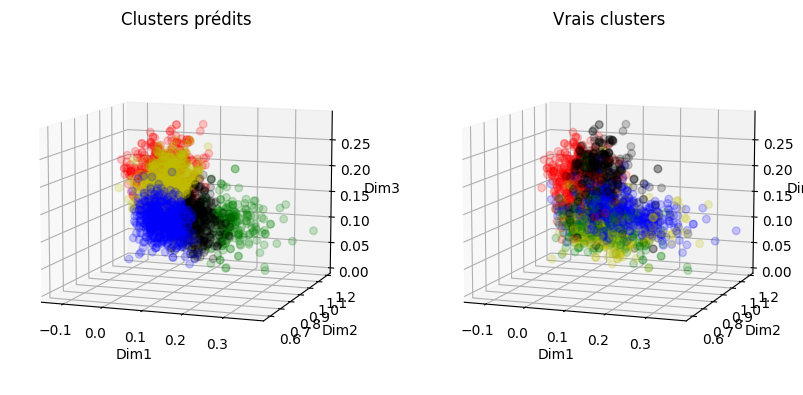

In [68]:
# Evaluation de la qualité du clustering
print_metrics(dkm_result_labels, y)

# Comparaison des clusters en 2D 
clust_viz_2D(dkm_result, dkm_result_labels)

# Comparaison des clusters en 3D
clust_viz_3D(dkm_result, dkm_result_labels, elev1=10, azim1=-70, elev2=10, azim2=-70)

Les résultats sont moins bons que ceux de Reduced Kmeans.

# Conclusion

In [69]:
# Ajout des résultats des approches simultanées au tableau récapitulatif
tab_all = tab.reset_index()

new_rows = [{'index': 'RKM', 
             'NMI': normalized_mutual_info_score(rkm_labels, y),
             'Accuracy': accuracy_score(rkm_labels, y),
             'ARI': adjusted_rand_score(rkm_labels, y),
             'NMI-ARI mean': np.mean([normalized_mutual_info_score(rkm_labels, y),
                                      adjusted_rand_score(rkm_labels, y)])},
            {'index': 'DKM', 
             'NMI': normalized_mutual_info_score(dkm_result_labels, y),
             'Accuracy': accuracy_score(dkm_result_labels, y),
             'ARI': adjusted_rand_score(dkm_result_labels, y),
             'NMI-ARI mean': np.mean([normalized_mutual_info_score(dkm_result_labels, y),
                                      adjusted_rand_score(dkm_result_labels, y)])}]

tab_all = tab_all.append(new_rows, ignore_index=True).set_index('index')

# Affichage du tableau de synthèse des résultats
tab_all

<ipython-input-69-1b0d9a5b26f2>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tab_all = tab_all.append(new_rows, ignore_index=True).set_index('index')


,NMI,Accuracy,ARI,NMI-ARI mean
index,,,,
Kmeans++,0.217563,0.297528,0.148246,0.182905
Kmedoids,0.187464,0.291685,0.141456,0.164460
Spherical Kmeans,0.213879,0.224719,0.146083,0.179981
CAH (simple),0.004508,0.229213,0.000051,0.002279
CAH (complet),0.190081,0.186517,0.114945,0.152513
CAH (moyen),0.168012,0.206742,0.041213,0.104612
CAH (Ward),0.207391,0.103371,0.150715,0.179053
PCA + Kmeans++,0.212031,0.386966,0.147015,0.179523
PCA + Kmedoids,0.190828,0.132584,0.132360,0.161594


In [70]:
# Meilleure combinaison
tab_all[tab_all["NMI-ARI mean"]==tab_all["NMI-ARI mean"].max()]

,NMI,Accuracy,ARI,NMI-ARI mean
index,,,,
t-SNE + CAH (moyen),0.269209,0.187416,0.202134,0.235672


Affichage du meilleur clustering

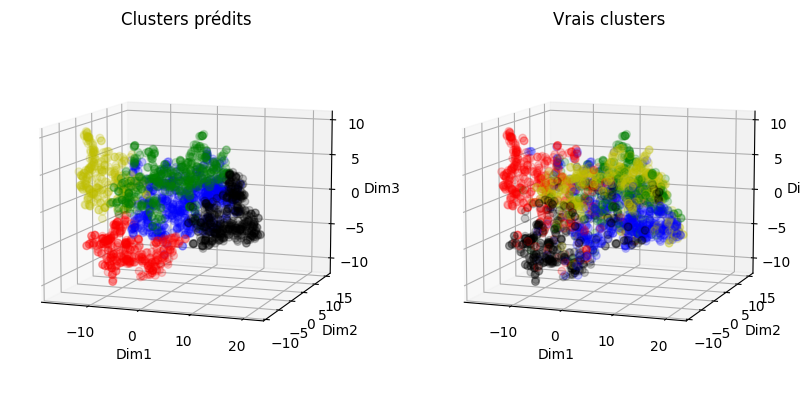

In [73]:
# Affichage du meilleur clustering en 3D
clust_viz_3D(tsne_result, tsne_hac_avg.labels_, elev1=10, azim1=-70, elev2=10, azim2=-70)

Même avec la meilleure combinaison, les clusters sont mal séparés. Les embeddings GloVe obtiendront peut être de meilleurs résultats. 